<a href="https://colab.research.google.com/github/jethrocsau/ColabDesign/blob/main/%5BFall24%5D_Cyclic_peptide_binder_design.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook is based on the AfDesign binder hallucination protocol in ColabDesign, which is published by Dr. Sergey Ovchinnikov on [GitHub](https://github.com/sokrypton/ColabDesign/tree/main/af)

This notebook was copied from:
https://github.com/ohuelab/ColabDesign-cyclic-binder
\

# AfDesign - cyclic peptide binder design
For a given protein target and cyclic binder length, generate/hallucinate a cyclic binder sequence AlphaFold thinks will bind to the target structure. To do this, we maximize number of contacts at the interface and maximize pLDDT of the binder.

# [0] Environmental Init

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/AFDesign
%ls

Mounted at /content/drive
/content/drive/MyDrive/AFDesign
 20241114-152633_6MU7_plddtboosted_seed57-60_log.csv
 20241114-152633_6MU7_plddtboosted_seed57-60_results.csv
 20241115-045524_6MU7_plddtboosted_seed70-90_log.csv
 20241115-045524_6MU7_plddtboosted_seed70-90_results.csv
 20241115-202620_6MU7_plddtboosted_seed80-90_log.csv
 20241115-202620_6MU7_plddtboosted_seed80-90_results.csv
 20241117-041746_6MU7_plddtboosted_seed90-110_log.csv
 20241117-041746_6MU7_plddtboosted_seed90-110_results.csv
 20241120-202101_6MU7_plddtboosted_seed110-120_log.csv
 20241120-202101_6MU7_plddtboosted_seed110-120_results.csv
 20241121-185806_6MU7_plddtboosted_seed110-130_log.csv
 20241121-185806_6MU7_plddtboosted_seed110-130_results.csv
 20241122-181534_6MU7_plddtboosted_seed110-130_log.csv
 20241122-181534_6MU7_plddtboosted_seed110-130_results.csv
 6MU7_42_Hotspot_experimental_control.pdb
 6MU7_hotspot_plddt5_l2mse1.0_len6_seed50.pickle
 6MU7_hotspot_plddt5_l2mse1.0_len6_seed51.pickle
 6MU7_hotspot_pldd

In [ ]:
# installations
import tensorflow as tf
tf.config.experimental.enable_op_determinism()
# install
!pip install "jax[cuda]" -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html
!pip install git+https://github.com/sokrypton/ColabDesign.git@v1.1.1


Looking in links: https://storage.googleapis.com/jax-releases/jax_cuda_releases.html
  Cloning https://github.com/sokrypton/ColabDesign.git (to revision v1.1.1) to /tmp/pip-req-build-4_dycrr2
  Running command git clone --filter=blob:none --quiet https://github.com/sokrypton/ColabDesign.git /tmp/pip-req-build-4_dycrr2
  Running command git checkout -b v1.1.1 --track origin/v1.1.1
  Switched to a new branch 'v1.1.1'
  Branch 'v1.1.1' set up to track remote branch 'v1.1.1' from 'origin'.
  Resolved https://github.com/sokrypton/ColabDesign.git to commit 374c2e65c43ef79065528d4eb0fc381d471e1e1f
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 82.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 373.9/373.9 kB 34.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 6.5 MB/s eta 0:00:00
  Created wheel for colabdesign: filename=colabdesign-1.1.1-py3-none-any.whl size=25101618 sha256=611c22118f0f37bde4abca275b1

In [ ]:
import logging
import datetime
import os
import jax
log_dir = os.path.join(os.getcwd(),'log')
date = str(datetime.datetime.today()).split()[0]
log_file_path = os.path.join(log_dir,f'log_{date}.log')
print(log_file_path)

# Set up the logger to log messages to both the console and a file
logging.basicConfig(level=logging.INFO,  # Set the logging level to INFO
                    format='%(asctime)s - %(levelname)s - %(message)s',
                    handlers=[
                        logging.StreamHandler(),  # Print to console (Colab output)
                        logging.FileHandler(log_file_path)  # Save to a file on Google Drive
                    ],  force=True)
logging.basicConfig(level=logging.INFO)

/content/drive/MyDrive/AFDesign/log/log_2024-11-23.log


In [ ]:
# Import & Init function define
import numpy as np
import pandas as pd
from scipy.special import softmax
import re
import time
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# setup
import os
if not os.path.isdir("params"):
  # get code
  os.system("pip -q install git+https://github.com/ohuelab/ColabDesign-cyclic-binder.git@cyc_binder")
  # for debugging
  os.system("ln -s /usr/local/lib/python3.*/dist-packages/colabdesign colabdesign")
  # download params
  os.system("mkdir params")
  os.system("apt-get install aria2 -qq")
  os.system("aria2c -q -x 16 https://storage.googleapis.com/alphafold/alphafold_params_2022-12-06.tar")
  os.system("tar -xf alphafold_params_2022-12-06.tar -C params")

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from colabdesign import mk_afdesign_model, clear_mem
from colabdesign.shared.utils import copy_dict
from colabdesign.af.alphafold.common import residue_constants
from IPython.display import HTML
from google.colab import files
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

#########################
def get_pdb(pdb_code=""):
  if pdb_code is None or pdb_code == "":
    upload_dict = files.upload()
    pdb_string = upload_dict[list(upload_dict.keys())[0]]
    with open("tmp.pdb","wb") as out: out.write(pdb_string)
    return "tmp.pdb"
  elif os.path.isfile(pdb_code):
    return pdb_code
  elif len(pdb_code) == 4:
    os.system(f"wget -qnc https://files.rcsb.org/view/{pdb_code}.pdb")
    return f"{pdb_code}.pdb"
  else:
    os.system(f"wget -qnc https://alphafold.ebi.ac.uk/files/AF-{pdb_code}-F1-model_v3.pdb")
    return f"AF-{pdb_code}-F1-model_v3.pdb"

def add_cyclic_offset(self, bug_fix=True):
  '''add cyclic offset to connect N and C term'''
  def cyclic_offset(L):
    i = np.arange(L)
    ij = np.stack([i,i+L],-1)
    offset = i[:,None] - i[None,:]
    c_offset = np.abs(ij[:,None,:,None] - ij[None,:,None,:]).min((2,3))
    if bug_fix:
      a = c_offset < np.abs(offset)
      c_offset[a] = -c_offset[a]
    return c_offset * np.sign(offset)
  idx = self._inputs["residue_index"]
  offset = np.array(idx[:,None] - idx[None,:])

  if self.protocol == "binder":
    c_offset = cyclic_offset(self._binder_len)
    offset[self._target_len:,self._target_len:] = c_offset
  self._inputs["offset"] = offset

In [ ]:
# Enable determinism
tf.keras.utils.set_random_seed(1)
tf.config.experimental.enable_op_determinism()


In [ ]:
#define helper functions
pdb_models = {}#@title **Define Helper Function**
def AFcyclic_setup(pdb_name, target_chain,binder_len,target_hotspot,use_multimer,target_flexible):

  #target info
  pdb = pdb_name
  #enter PDB code or UniProt code (to fetch AlphaFoldDB model) or leave blink to upload your own
  target_chain = target_chain

  x = {"pdb_filename":pdb,
      "chain":target_chain,
      "binder_len":binder_len,
      "hotspot":target_hotspot,
      "use_multimer":use_multimer,
      "rm_target_seq":target_flexible}

  x["pdb_filename"] = get_pdb(x["pdb_filename"])

  if "x_prev" not in dir() or x != x_prev:
    clear_mem()
    model = mk_afdesign_model(
      protocol="binder",
      use_multimer=x["use_multimer"],
      num_recycles=num_recycles,
      recycle_mode="sample"
    )
    model.prep_inputs(
      **x,
      ignore_missing=False
    )
    x_prev = copy_dict(x)
    print("target length:", model._target_len)
    print("binder length:", model._binder_len)
    binder_len = model._binder_len

  # Set cyclic offset
  if cyclic_offset:
    if bugfix:
        print("Set bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucionated.")
        add_cyclic_offset(model, bug_fix=True)
    else:
        print("Set not bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucionated.")
        add_cyclic_offset(model, bug_fix=False)
  else:
    print("Don't set cyclic offset. The linear peptide binder will be hallucionated.")

  return model

In [ ]:
def parse_indices(index_str):
  str_indexes = index_str.split(',')
  indices = []
  for index in str_indexes:
    index = index.strip()
    if ":" in index:
      range_split = index.split(':')
      if len(range_split)==2:
        start = int(range_split[0])
        end = int(range_split[1])
        for val in range(start,end+1):
          indices.append(val)
      elif len(range_split)==3:
        start = int(range_split[0])
        end = int(range_split[1])
        step = int(range_split[2])
        for val in range(start,end+1,step):
          indices.append(val)
      else:
        print("Error: invalid range call")
    else:
      val = index.strip()
      indices.append(int(val))
  return indices



---



# [1] Multi-run Hotspot Explorations

In [ ]:
# **parameters**

#Cyclic offset & fixed model params
cyclic_offset = True
bugfix = True
use_multimer = True  #use alphafold-multimer for design
control = True #set a control for hotspot with no hotspot
#allow backbone of target structure to be flexible
target_flexible = False

# Binder configurations
binder_len = 13
binder_seq = ""
binder_seq = re.sub("[^A-Z]", "", binder_seq.upper())
if len(binder_seq) > 0:
  binder_len = len(binder_seq)
else:
  binder_seq = None

# num models used
num_recycles = 0
num_models = "1"
num_models = 5 if num_models == "all" else int(num_models)

# WARNING: The output sequence from `pssm`,`logits`,`soft` is not one_hot. To get a valid sequence use the other optimizers, or redesign the output backbone with another protocol like ProteinMPNN.
# ----
# #### advanced GD settings
# ["pssm_semigreedy", "3stage", "semigreedy", "pssm", "logits", "soft", "hard"]
# - `pssm_semigreedy` - uses the designed PSSM to bias semigreedy opt. (Recommended)
# - `3stage` - gradient based optimization (GD) (logits → soft → hard)
# - `pssm` - GD optimize (logits → soft) to get a sequence profile (PSSM).
# - `logits` - GD optimize logits inputs (continious)
# - `soft` - GD optimize softmax(logits) inputs (probabilities)
# - `hard` - GD optimize one_hot(logits) inputs (discrete)

GD_method = "sgd"
optimizer = "pssm_semigreedy"
#param ["adabelief", "adafactor", "adagrad", "adam", "adamw", "fromage", "lamb", "lars", "noisy_sgd", "dpsgd", "radam", "rmsprop", "sgd", "sm3", "yogi"]

#learning param
learning_rate = 0.1
norm_seq_grad = True
dropout = True

# PDB ids
pdb_ids = [('6MU7','G')]
pdb_models = {}

#set seed
SEED_START = 40
SEED_END = 41

#Hotpots: restrict loss to predefined positions on target (eg. "1-10,12,15")
#hotspots = [None,'100','100-105','100-110','100-115','100-120']
#hotspots = ["15-20", "50-55", "100-105", "150-155","200",None]
hotspots = ["15","50","100","150"]


In [ ]:
# **init runtime variables**
## Init dataframes
log_df = pd.DataFrame(columns = ['con', 'exp_res', 'i_con', 'i_pae', 'pae', 'plddt', 'seq_ent', 'loss',\
                                 'i_ptm', 'ptm', 'hard', 'soft', 'temp', 'recycles', 'models', 'pdb', 'seed', 'train_seq','hotspot'])
results_df = pd.DataFrame(columns = ['con', 'exp_res', 'hard', 'i_con', 'i_pae', 'i_ptm', 'loss', 'models',\
       'pae', 'plddt', 'ptm', 'recycles', 'seq_ent', 'soft', 'temp',\
       'sequence','pdb','seed','GD_method','optimizer','learning_rate','norm_seq_grad','dropout','num_recycles','num_models','hotspot','seconds'])

pdb_count = 0

#save dir
current = os.getcwd()
save_dir = current + f'/Hotspots-Runs'

In [ ]:
#@title [multi-run] Does using hotspots reduce computational time?

for pdb_id in pdb_ids:

  # set pdb
  pdb_name = pdb_id[0]
  target_chain = pdb_id[1]

  for target_hotspot in hotspots:
    # set pdb
    print("Configuring PDB of model to: ", pdb_name, ": ", target_hotspot )
    try:
      model = AFcyclic_setup(pdb_name, target_chain,binder_len,target_hotspot,use_multimer,target_flexible)
    except Exception as e:
      print("Error with downloading PDB for: " ,pdb_name, ": ", target_hotspot)
      print(e)
      continue

    # set optimizer & model
    print("Configuring optimizer...")
    model.set_optimizer(optimizer=GD_method,
                      learning_rate=learning_rate,
                      norm_seq_grad=norm_seq_grad)
    models = model._model_names[:num_models]

    for seed in range(SEED_START,SEED_END):
      #set seed
      print("Setting seed at: ", seed)
      model.restart(seq=binder_seq,seed = seed)

      #run hallucination model
      flags = {"num_recycles":num_recycles,
              "models":models,
              "dropout":dropout}

      #set timer
      start = time.perf_counter()

      #run model
      if optimizer == "3stage":
        model.design_3stage(120, 60, 10, **flags)
        pssm = softmax(model._tmp["seq_logits"],-1)

      #original: 120,32, **flags
      if optimizer == "pssm_semigreedy":
        model.design_pssm_semigreedy(120, 32, **flags)
        pssm = softmax(model._tmp["seq_logits"],1)

      if optimizer == "semigreedy":
        model.design_pssm_semigreedy(0, 32, **flags)
        pssm = None

      if optimizer == "pssm":
        model.design_logits(120, e_soft=1.0, num_models=1, ramp_recycles=True, **flags)
        model.design_soft(32, num_models=1, **flags)
        flags.update({"dropout":False,"save_best":True})
        model.design_soft(10, num_models=num_models, **flags)
        pssm = softmax(model.aux["seq"]["logits"],-1)

      #save pdb
      #model.save_pdb(f"{save_dir}{pdb_name}_{model.protocol}_{target_hotspot}__seed{seed}.pdb")
      model.save_pdb(f"{pdb_name}_{model.protocol}_{target_hotspot}__seed{seed}.pdb")

      #log time
      end = time.perf_counter()

      # store pdb model
      key = pdb_name + "_" + str(seed)
      pdb_models[key] = model

      # write results to dataframe
      #set df
      df1 = pd.DataFrame(model._tmp['log'])
      df1['pdb'] = pdb_name
      df1['seed'] = seed
      df1['train_seq'] = df1.index + 1
      df1['hotspot'] = target_hotspot

      # best binder results
      best_df = pd.DataFrame(model._tmp['best']["aux"]["log"])
      best_df['sequence'] = model.get_seq()[0]
      print("Sequence for {pdb_name}, seed = {seed}: ",model.get_seq()[0])
      best_df['pdb'] = pdb_name
      best_df['seed'] = seed
      best_df['GD_method'] = GD_method
      best_df['optimizer'] = optimizer
      best_df['learning_rate'] = learning_rate
      best_df['norm_seq_grad'] = norm_seq_grad
      best_df['dropout'] = dropout
      best_df['num_recycles'] = num_recycles
      best_df['num_models'] = num_models
      best_df['hotspot'] = target_hotspot
      best_df['seconds'] = end-start

      #append
      log_df = pd.concat([log_df, df1])
      results_df = pd.concat([results_df,best_df])


Configuring PDB of model to:  6MU7 :  15


2024-11-06 17:06:53,101 - INFO - Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-11-06 17:06:53,361 - INFO - Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


Error with downloading PDB for:  6MU7 :  15
ERROR: positions 15 and chain G not found
Configuring PDB of model to:  6MU7 :  50
target length: 441
binder length: 13
Set bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucionated.
Configuring optimizer...
Setting seed at:  40
Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss 4.85 i_con 4.78 plddt 0.26 ptm 0.86 i_ptm 0.23
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss 4.45 i_con 4.38 plddt 0.29 ptm 0.86 i_ptm 0.25
3 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.30 i_con 4.22 plddt 0.27 ptm 0.86 i_ptm 0.25
4 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 3.99 i_con 3.92 plddt 0.28 ptm 0.87 i_ptm 0.35
5 models [0] recycles 0 hard 0 soft 0.04 temp 1 loss 4.20 i_con 4.13 plddt 0.27 ptm 0.86 i_ptm 0.27
6 models [0] recycles 0 hard 0 soft 0.05 temp 1 loss 4.24 i_con 4.17 plddt 0.29 ptm 0.87 i_ptm 0.30
7 models [0] recycles 0 hard 0 soft 0.06 temp 1 loss 4.10 i_con

In [ ]:
results_df

,con,exp_res,hard,i_con,i_pae,i_ptm,loss,models,pae,plddt,...,seed,GD_method,optimizer,learning_rate,norm_seq_grad,dropout,num_recycles,num_models,hotspot,seconds
0,0.0,0.052150,1.0,3.297841,0.533134,0.588371,3.358747,0,0.522446,0.390946,...,1,sgd,pssm_semigreedy,0.1,True,True,0,1,None,2722.599177
0,0.0,0.101666,1.0,3.088712,0.317901,0.682958,3.130018,0,0.426358,0.586948,...,1,sgd,pssm_semigreedy,0.1,True,True,0,1,100,2726.515175
0,0.0,0.295642,1.0,3.654275,0.514050,0.477004,3.720087,0,0.610313,0.341876,...,1,sgd,pssm_semigreedy,0.1,True,True,0,1,100-105,2733.477499
0,0.0,0.092276,1.0,3.113462,0.330570,0.663349,3.155167,0,0.437303,0.582951,...,1,sgd,pssm_semigreedy,0.1,True,True,0,1,100-110,2734.201046
0,0.0,0.085166,1.0,3.309887,0.393318,0.610113,3.367026,0,0.506754,0.428611,...,1,sgd,pssm_semigreedy,0.1,True,True,0,1,100-115,2735.500011
0,0.0,0.227637,1.0,3.046120,0.332193,0.683624,3.090057,0,0.438786,0.560630,...,1,sgd,pssm_semigreedy,0.1,True,True,0,1,100-120,2739.833050


In [ ]:
#save results
import datetime as dt

#save results
run2_log = log_df
run2_results = results_df
pdb_count = len(pdb_ids)
var = SEED_END-SEED_START

#capture runtime data
timestr = time.strftime("%Y%m%d-%H%M%S")

# List of DataFrames
log_filename = f'{timestr}_Hotspots_{pdb_count}_modelnum{num_models}_seedno{var}_log.csv'
result_filename = f'{timestr}_Hotspots_{pdb_count}_modelnum{num_models}_seedno{var}_results.csv'

run2_log.to_csv(log_filename, index=False)
run2_results.to_csv(result_filename, index=False)



---



# [2.1] Experiment 2.1: Does increasing plddt loss function impact the generated results?

*   Single run
*   HIV: pdb_ids = ('6V0R','A')
* Seeds used to run = 20,23,25,26,27
* binder_len = 13




In [ ]:
#@title set-up
# prep model inputs**
import re

#Cyclic offset & fixed model params
cyclic_offset = True
bugfix = True
use_multimer = True  #use alphafold-multimer for design
control = True #set a control for hotspot with no hotspot

#enter PDB code or UniProt code (to fetch AlphaFoldDB model) or leave blink to upload your own
pdb = "6V0R"
target_chain = "A"

#allow backbone of target structure to be flexible
target_flexible = False

# Binder configurations
binder_len = 13
binder_seq = ""
binder_seq = re.sub("[^A-Z]", "", binder_seq.upper())
if len(binder_seq) > 0:
  binder_len = len(binder_seq)
else:
  binder_seq = None

# num models used
num_recycles = 0
num_models = "1"
num_models = 5 if num_models == "all" else int(num_models)

 #@title Experiment 1: setup
target_hotspot = ""
if target_hotspot == "": target_hotspot = None

#Configure parameters
HIV_hotspot = {"pdb_filename":pdb,
     "chain":target_chain,
     "binder_len":binder_len,
     "hotspot":target_hotspot,
     "use_multimer":use_multimer,
     "rm_target_seq":target_flexible}

#set models
HIV_hotspot["pdb_filename"] = get_pdb(HIV_hotspot["pdb_filename"])

#set HIV hotspot
if "x_prev" not in dir() or HIV_hotspot != x_prev:
  clear_mem()
  model_1 = mk_afdesign_model(
    protocol="binder",
    use_multimer=HIV_hotspot["use_multimer"],
    num_recycles=num_recycles,
    recycle_mode="sample"
  )
  model_1.prep_inputs(
    **HIV_hotspot,
    ignore_missing=False
  )
  x_prev = copy_dict(HIV_hotspot)
  print("target length:", model_1._target_len)
  print("binder length:", model_1._binder_len)
  binder_len = model_1._binder_len

# Set cyclic offset
if cyclic_offset:
  if bugfix:
      print("Set bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.")
      add_cyclic_offset(model_1, bug_fix=True)
  else:
      print("Set not bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.")
      add_cyclic_offset(model_1, bug_fix=False)
else:
  print("Don't set cyclic offset. The linear peptide binder will be hallucinated.")

2024-10-17 13:33:10,462 - INFO - Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-10-17 13:33:10,466 - INFO - Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


target length: 438
binder length: 13
Set bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.


In [ ]:
#@title Experiment 1: parameter & seed setup
from scipy.special import softmax

#learning param
optimizer = "pssm_semigreedy"
GD_method = "sgd"
learning_rate = 0.1
norm_seq_grad = True
dropout = True

# set seed
SEED = 26

In [ ]:
#@title Experiment Run 1a: i_con 1.0, plddt 0.1
model_1.set_weights(i_con = 1.0, plddt = 0.1)

#set seed & model params
model_1.restart(seq=binder_seq, seed = SEED)
model_1.set_optimizer(optimizer=GD_method,
                    learning_rate=learning_rate,
                    norm_seq_grad=norm_seq_grad)
models = model_1._model_names[:num_models]

#@ run model
flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}

if optimizer == "pssm_semigreedy":
  model_1.design_pssm_semigreedy(120, 32, **flags)
  pssm = softmax(model_1._tmp["seq_logits"],1)

model_1.save_pdb(f"plddt-loss_weight_{pdb}_icon1_plddt0.1_seed{SEED}.pdb")

Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss 4.30 i_con 4.23 plddt 0.28 ptm 0.85 i_ptm 0.25
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss 4.25 i_con 4.18 plddt 0.27 ptm 0.85 i_ptm 0.26
3 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.11 i_con 4.04 plddt 0.30 ptm 0.85 i_ptm 0.28
4 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.02 i_con 3.95 plddt 0.32 ptm 0.85 i_ptm 0.31
5 models [0] recycles 0 hard 0 soft 0.04 temp 1 loss 4.00 i_con 3.93 plddt 0.36 ptm 0.86 i_ptm 0.36
6 models [0] recycles 0 hard 0 soft 0.05 temp 1 loss 4.01 i_con 3.94 plddt 0.36 ptm 0.86 i_ptm 0.36
7 models [0] recycles 0 hard 0 soft 0.06 temp 1 loss 4.13 i_con 4.07 plddt 0.34 ptm 0.85 i_ptm 0.32
8 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss 4.01 i_con 3.94 plddt 0.35 ptm 0.86 i_ptm 0.35
9 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss 4.05 i_con 3.98 plddt 0.32 ptm 0.85 i_ptm 0.33
10 models [0] recycles 0 hard 0 soft 0.08 temp 1 loss 3.88 i_con 3.

In [ ]:
%cd custom-loss-experiments/

/content/drive/MyDrive/AFDesign/custom-loss-experiments


In [ ]:
import pickle

#Store results
log_w0 = model_1._tmp
param_w0 = model_1.opt
aux_w0 = model_1.aux
callback_w0 = model_1._callbacks

w0_save = {'weight':{'i_con':1.0, 'plddt':0.1},
           'log': log_w0,
           'param': param_w0,
           'aux': aux_w0,
           'callback':callback_w0
}

filename = f'6V0R_w0_seed{SEED}.pickle'
with open(filename, 'wb') as handle:
    pickle.dump(w0_save, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
# display run1:i_con = 1, plddt = 0.1
color = "chain" #@param ["chain", "pLDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = True #@param {type:"boolean"}
color_HP = True #@param {type:"boolean"}
animate = True #@param {type:"boolean"}
model_1.plot_pdb(show_sidechains=show_sidechains,
               show_mainchains=show_mainchains,
               color=color, color_HP=color_HP, animate=animate)
model_1.get_seqs()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

['TIDPTFPKEKGAR']

here we see that i_cmap is close to 1, suggesting that the model is already quite sufficiently interfacing with the contact.


<Axes: >

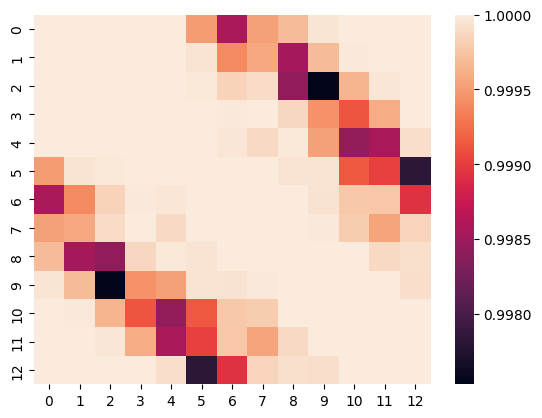

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.heatmap(aux_w0['i_cmap'][-bL:,-bL:])

In [ ]:
#@title Experiment Run 1b: i_con 1.0, plddt 0.5
model_1.restart(seq=binder_seq, seed = SEED)
model_1.set_weights(i_con = 1.0, plddt = 0.5)


#@ run model
flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}

if optimizer == "pssm_semigreedy":
  model_1.design_pssm_semigreedy(120, 32, **flags)
  pssm = softmax(model_1._tmp["seq_logits"],1)

model_1.save_pdb(f"plddt-loss_weight_{pdb}_icon0.1_plddt0.5_seed{SEED}.pdb")

Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss 4.59 i_con 4.23 plddt 0.28 ptm 0.85 i_ptm 0.25
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss 4.61 i_con 4.25 plddt 0.27 ptm 0.85 i_ptm 0.24
3 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.33 i_con 3.97 plddt 0.30 ptm 0.85 i_ptm 0.31
4 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.33 i_con 3.98 plddt 0.29 ptm 0.85 i_ptm 0.31
5 models [0] recycles 0 hard 0 soft 0.04 temp 1 loss 4.34 i_con 4.00 plddt 0.31 ptm 0.85 i_ptm 0.33
6 models [0] recycles 0 hard 0 soft 0.05 temp 1 loss 4.39 i_con 4.04 plddt 0.29 ptm 0.85 i_ptm 0.30
7 models [0] recycles 0 hard 0 soft 0.06 temp 1 loss 4.21 i_con 3.89 plddt 0.35 ptm 0.85 i_ptm 0.37
8 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss 4.17 i_con 3.83 plddt 0.34 ptm 0.86 i_ptm 0.38
9 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss 4.15 i_con 3.83 plddt 0.35 ptm 0.85 i_ptm 0.39
10 models [0] recycles 0 hard 0 soft 0.08 temp 1 loss 4.09 i_con 3.

In [ ]:
# save results to json
import pickle

#Store results
log_w1 = model_1._tmp
param_w1 = model_1.opt
aux_w1 = model_1.aux
callback_w1 = model_1._callbacks

w1_save = {'weight':{'i_con':1.0, 'plddt':0.5},
           'log': log_w1,
           'param': param_w1,
           'aux': aux_w1,
           'callback':callback_w1
}

filename = f'6V0R_w1_seed{SEED}.pickle'
with open(filename, 'wb') as handle:
    pickle.dump(w1_save, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
# display run1:i_con = 1, plddt = 0.5
color = "chain" #@param ["chain", "pLDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = True #@param {type:"boolean"}
color_HP = True #@param {type:"boolean"}
animate = True #@param {type:"boolean"}
model_1.plot_pdb(show_sidechains=show_sidechains,
               show_mainchains=show_mainchains,
               color=color, color_HP=color_HP, animate=animate)
model_1.get_seqs()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

['AFFKWMFKGNDRE']

<Axes: >

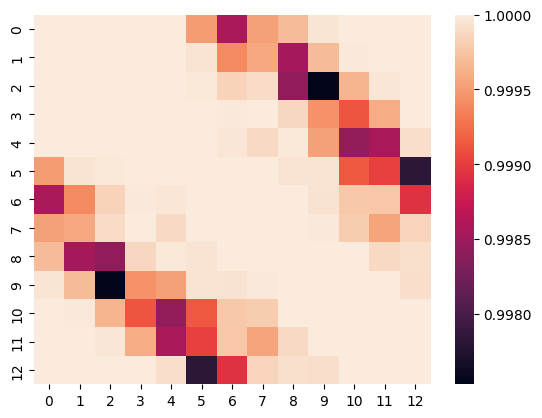

In [ ]:
sns.heatmap(aux_w1['i_cmap'][-bL:,-bL:])

In [ ]:
#@title Experiment Run 1c: i_con 1.0, plddt 1
model_1.restart(seq=binder_seq, seed = SEED)
model_1.set_weights(i_con = 1.0, plddt = 1)

#@ run model
flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}

if optimizer == "pssm_semigreedy":
  model_1.design_pssm_semigreedy(120, 32, **flags)
  pssm = softmax(model_1._tmp["seq_logits"],1)

model_1.save_pdb(f"plddt-loss_weight_{pdb}_icon1_plddt1_seed{SEED}.pdb")

Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss 4.95 i_con 4.23 plddt 0.28 ptm 0.85 i_ptm 0.25
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss 4.94 i_con 4.20 plddt 0.26 ptm 0.85 i_ptm 0.25
3 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.71 i_con 4.01 plddt 0.30 ptm 0.85 i_ptm 0.30
4 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.65 i_con 3.96 plddt 0.32 ptm 0.85 i_ptm 0.30
5 models [0] recycles 0 hard 0 soft 0.04 temp 1 loss 4.76 i_con 4.04 plddt 0.29 ptm 0.85 i_ptm 0.31
6 models [0] recycles 0 hard 0 soft 0.05 temp 1 loss 4.83 i_con 4.12 plddt 0.30 ptm 0.85 i_ptm 0.28
7 models [0] recycles 0 hard 0 soft 0.06 temp 1 loss 4.68 i_con 4.00 plddt 0.33 ptm 0.85 i_ptm 0.32
8 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss 4.53 i_con 3.88 plddt 0.35 ptm 0.86 i_ptm 0.37
9 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss 4.62 i_con 3.95 plddt 0.32 ptm 0.85 i_ptm 0.34
10 models [0] recycles 0 hard 0 soft 0.08 temp 1 loss 4.58 i_con 3.

In [ ]:
#process & save
log_w2 = model_1._tmp
param_w2 = model_1.opt
aux_w2 = model_1.aux
callback_w2 = model_1._callbacks

# save results to json
import pickle
w2_save = {'weight':{'i_con':1.0, 'plddt':1.0},
           'log': log_w2,
           'param': param_w2,
           'aux': aux_w2,
           'callback':callback_w2
}

filename = f'6V0R_w2_seed{SEED}.pickle'
with open(filename, 'wb') as handle:
    pickle.dump(w2_save, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [ ]:
# display run2: i_con = 1, plddt = 1  {run: "auto"}
color = "chain" #@param ["chain", "pLDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = True #@param {type:"boolean"}
color_HP = True #@param {type:"boolean"}
animate = True #@param {type:"boolean"}
model_1.plot_pdb(show_sidechains=show_sidechains,
               show_mainchains=show_mainchains,
               color=color, color_HP=color_HP, animate=animate)
model_1.get_seqs()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

['YDIFTQMTSWQKV']

<Axes: >

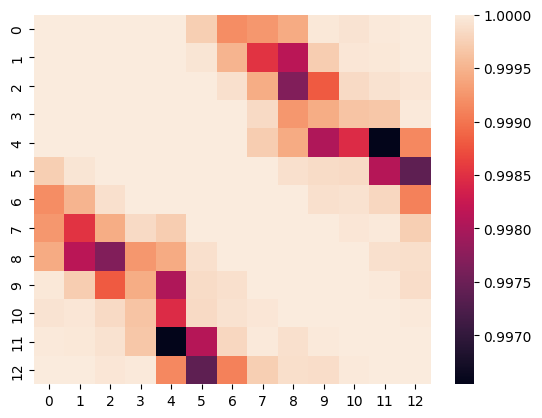

In [ ]:
sns.heatmap(aux_w2['i_cmap'][-bL:,-bL:])

# [2.2] Experiment 2.2: How can we tune loss functions to improve the precision of generated peptides?

In [ ]:
#@title [LOSS] pDockQ Loss Function
import jax.numpy as jnp

def pDockQ(outputs, aux):
  #pDockQ fitted parameters per literature
  L = 0.724
  X0 = 152.611
  k = 0.052
  b = 0.018
  bL = binder_len #TO CHANGE LATER hard coding in first

  # calculate the average interface pLDDT
  plddt = aux['plddt'][-bL:]
  avg_plddt = jnp.multiply(jnp.mean(plddt),100) #scale to a 0-100 scale instead of prob
  #jax.debug.print("average plddt: {}",avg_plddt) #debug

  # calculte # of contact
  i_cmap_binder = aux['i_cmap'][-bL:,:]
  i_cmap_flatten = jnp.ravel(i_cmap_binder)
  contact_count = jnp.sum(jnp.where(i_cmap_flatten >= 0.95,i_cmap_flatten,0))
  #jax.debug.print("contact_count: {}",contact_count) #debug

  # get average plddt * log(interface contact)
  X = jnp.multiply(avg_plddt, jnp.log(contact_count+1)) #+1 to prevent Nan
  #jax.debug.print("X: {}",X) #debug

  # calculate loss
  loss = jnp.divide(L, 1 + jnp.exp(-k*(X - X0))) + b
  #jax.debug.print("loss: {}",loss)  #debug


  return {"custom_loss":loss}

In [ ]:
#testing
#pDockQ('test',w2_seed20['aux'])

{'custom_loss': Array(0.7419998, dtype=float32)}

In [ ]:
#@title prep model with pDockQ score

import re

#Cyclic offset & fixed model params
cyclic_offset = True
bugfix = True
use_multimer = True  #use alphafold-multimer for design
control = True #set a control for hotspot with no hotspot

#enter PDB code or UniProt code (to fetch AlphaFoldDB model) or leave blink to upload your own
pdb = "6V0R"
target_chain = "A"

#allow backbone of target structure to be flexible
target_flexible = False

# Binder configurations
binder_len = 13
binder_seq = ""
binder_seq = re.sub("[^A-Z]", "", binder_seq.upper())
if len(binder_seq) > 0:
  binder_len = len(binder_seq)
else:
  binder_seq = None

# num models used
num_recycles = 0
num_models = "1"
num_models = 5 if num_models == "all" else int(num_models)

 #@title Experiment 1: setup
target_hotspot = ""
if target_hotspot == "": target_hotspot = None

#Configure parameters
HIV_hotspot = {"pdb_filename":pdb,
     "chain":target_chain,
     "binder_len":binder_len,
     "hotspot":target_hotspot,
     "use_multimer":use_multimer,
     "rm_target_seq":target_flexible}

#set models
HIV_hotspot["pdb_filename"] = get_pdb(HIV_hotspot["pdb_filename"])

#set HIV hotspot
if "x_prev" not in dir() or HIV_hotspot != x_prev:
  clear_mem()
  model_1 = mk_afdesign_model(
    protocol="binder",
    use_multimer=HIV_hotspot["use_multimer"],
    num_recycles=num_recycles,
    recycle_mode="sample",
    loss_callback=pDockQ
  )
  model_1.prep_inputs(
    **HIV_hotspot,
    ignore_missing=False
  )
  x_prev = copy_dict(HIV_hotspot)
  print("target length:", model_1._target_len)
  print("binder length:", model_1._binder_len)
  binder_len = model_1._binder_len

# Set cyclic offset
if cyclic_offset:
  if bugfix:
      print("Set bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.")
      add_cyclic_offset(model_1, bug_fix=True)
  else:
      print("Set not bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.")
      add_cyclic_offset(model_1, bug_fix=False)
else:
  print("Don't set cyclic offset. The linear peptide binder will be hallucinated.")


2024-10-21 17:18:38,463 - INFO - Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-10-21 17:18:38,467 - INFO - Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


NameError: name 'pDockQ' is not defined

In [ ]:
#@title SEED & param set
from scipy.special import softmax

#learning param
optimizer = "pssm_semigreedy"
GD_method = "sgd"
learning_rate = 0.1
norm_seq_grad = True
dropout = True

# set seed
SEED = 20

In [ ]:
#@title Experiment Run 2a: Change model weights: i_con = 1.0, pDockQ = 0.1

#set seed & model params
model_1.restart(seq=binder_seq, seed = SEED)
model_1.set_optimizer(optimizer=GD_method,
                    learning_rate=learning_rate,
                    norm_seq_grad=norm_seq_grad)
models = model_1._model_names[:num_models]

#change weights
model_1.set_weights(i_con = 1.0)
model_1.opt['weights']['pDockQ'] = 0.1
print(model_1.opt)

{'alpha': 2.0, 'con': {'binary': False, 'cutoff': 14.0, 'num': 2, 'num_pos': inf, 'seqsep': 9}, 'dropout': True, 'fape_cutoff': 10.0, 'hard': 0.0, 'i_con': {'binary': False, 'cutoff': 21.6875, 'num': 1, 'num_pos': inf}, 'learning_rate': 0.1, 'norm_seq_grad': True, 'num_models': 1, 'num_recycles': 0, 'pssm_hard': True, 'sample_models': True, 'soft': 0.0, 'temp': 1.0, 'template': {'rm_ic': False}, 'weights': {'con': 0.0, 'exp_res': 0.0, 'helix': 0.0, 'i_con': 1.0, 'i_pae': 0.0, 'pae': 0.0, 'plddt': 0.1, 'seq_ent': 0.0, 'pDockQ': 0.1}}


In [ ]:
#title run model for comparison
flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}

if optimizer == "pssm_semigreedy":
  model_1.design_pssm_semigreedy(120, 32, **flags)
  pssm = softmax(model_1._tmp["seq_logits"],1)

model_1.save_pdb(f"pdockq-loss_weight_{pdb}_icon1_pdockq0.1_seed{SEED}.pdb")

#Store results
log_wPDQ = model_1._tmp
param_wPDQ = model_1.opt
aux_wPDQ = model_1.aux
callback_wPDQ = model_1._callbacks

#binder plddt
bL = model_1._binder_len
binder_plddt_wPDQ = aux_wPDQ['plddt'][-bL:]

Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss 4.98 i_con 4.23 plddt 0.28 ptm 0.85 i_ptm 0.25 custom_loss 0.67
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss 5.03 i_con 4.30 plddt 0.28 ptm 0.84 i_ptm 0.22 custom_loss 0.66
3 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.77 i_con 4.02 plddt 0.29 ptm 0.85 i_ptm 0.26 custom_loss 0.69
4 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.77 i_con 4.05 plddt 0.27 ptm 0.85 i_ptm 0.27 custom_loss 0.64
5 models [0] recycles 0 hard 0 soft 0.04 temp 1 loss 4.83 i_con 4.08 plddt 0.29 ptm 0.85 i_ptm 0.29 custom_loss 0.68
6 models [0] recycles 0 hard 0 soft 0.05 temp 1 loss 4.81 i_con 4.05 plddt 0.29 ptm 0.85 i_ptm 0.28 custom_loss 0.69
7 models [0] recycles 0 hard 0 soft 0.06 temp 1 loss 4.92 i_con 4.18 plddt 0.28 ptm 0.85 i_ptm 0.26 custom_loss 0.67
8 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss 4.86 i_con 4.07 plddt 0.32 ptm 0.86 i_ptm 0.31 custom_loss 0.72
9 models [0] recycles 0 hard 0 

In [ ]:
# display run1:i_con = 1, plddt = 0.5
color = "chain" #@param ["chain", "pLDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = True #@param {type:"boolean"}
color_HP = True #@param {type:"boolean"}
animate = True #@param {type:"boolean"}
model_1.plot_pdb(show_sidechains=show_sidechains,
               show_mainchains=show_mainchains,
               color=color, color_HP=color_HP, animate=animate)
model_1.get_seqs()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

['QKFMEKVMAHMKN']

In [ ]:
import pickle
PDQw0_save = {'weight':{'i_con':1.0, 'plddt':0.1, 'pdockq':0.1},
           'log': log_wPDQ,
           'param': param_wPDQ,
           'aux': aux_wPDQ,
           'callback':callback_wPDQ
}

filename = f'6V0R_PDQw0_seed{SEED}.pickle'
with open(filename, 'wb') as handle:
    pickle.dump(PDQw0_save, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
#@title Experiment Run 2b: Change model weights: i_con = 1.0, pDockQ = 0.5

#set seed & model params
model_1.restart(seq=binder_seq, seed = SEED)
model_1.set_optimizer(optimizer=GD_method,
                    learning_rate=learning_rate,
                    norm_seq_grad=norm_seq_grad)
models = model_1._model_names[:num_models]

#change weights
model_1.set_weights(i_con = 1.0)
model_1.opt['weights']['pDockQ'] = 0.5
print(model_1.opt)

{'alpha': 2.0, 'con': {'binary': False, 'cutoff': 14.0, 'num': 2, 'num_pos': inf, 'seqsep': 9}, 'dropout': True, 'fape_cutoff': 10.0, 'hard': 0.0, 'i_con': {'binary': False, 'cutoff': 21.6875, 'num': 1, 'num_pos': inf}, 'learning_rate': 0.1, 'norm_seq_grad': True, 'num_models': 1, 'num_recycles': 0, 'pssm_hard': True, 'sample_models': True, 'soft': 0.0, 'temp': 1.0, 'template': {'rm_ic': False}, 'weights': {'con': 0.0, 'exp_res': 0.0, 'helix': 0.0, 'i_con': 1.0, 'i_pae': 0.0, 'pDockQ': 0.5, 'pae': 0.0, 'plddt': 0.1, 'seq_ent': 0.0}}


In [ ]:
# run model for comparison
flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}

if optimizer == "pssm_semigreedy":
  model_1.design_pssm_semigreedy(120, 32, **flags)
  pssm = softmax(model_1._tmp["seq_logits"],1)

model_1.save_pdb(f"pdockq-loss_weight_{pdb}_icon1_pdockq0.5_seed{SEED}.pdb")

#Store results
log_wPDQ = model_1._tmp
param_wPDQ = model_1.opt
aux_wPDQ = model_1.aux
callback_wPDQ = model_1._callbacks

#binder plddt
bL = model_1._binder_len
binder_plddt_wPDQ = aux_wPDQ['plddt'][-bL:]

Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss 4.98 i_con 4.23 plddt 0.28 ptm 0.85 i_ptm 0.25 custom_loss 0.67
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss 5.03 i_con 4.30 plddt 0.28 ptm 0.84 i_ptm 0.22 custom_loss 0.66
3 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.77 i_con 4.02 plddt 0.29 ptm 0.85 i_ptm 0.26 custom_loss 0.69
4 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.77 i_con 4.05 plddt 0.27 ptm 0.85 i_ptm 0.27 custom_loss 0.64
5 models [0] recycles 0 hard 0 soft 0.04 temp 1 loss 4.83 i_con 4.08 plddt 0.29 ptm 0.85 i_ptm 0.29 custom_loss 0.68
6 models [0] recycles 0 hard 0 soft 0.05 temp 1 loss 4.81 i_con 4.05 plddt 0.29 ptm 0.85 i_ptm 0.28 custom_loss 0.69
7 models [0] recycles 0 hard 0 soft 0.06 temp 1 loss 4.92 i_con 4.18 plddt 0.28 ptm 0.85 i_ptm 0.26 custom_loss 0.67
8 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss 4.86 i_con 4.07 plddt 0.32 ptm 0.86 i_ptm 0.31 custom_loss 0.72
9 models [0] recycles 0 hard 0 

In [ ]:
# display run1:i_con = 1, plddt = 0.5
color = "chain" #@param ["chain", "pLDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = True #@param {type:"boolean"}
color_HP = True #@param {type:"boolean"}
animate = True #@param {type:"boolean"}
model_1.plot_pdb(show_sidechains=show_sidechains,
               show_mainchains=show_mainchains,
               color=color, color_HP=color_HP, animate=animate)
model_1.get_seqs()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

['QKFMEKVMAHMKN']

In [ ]:
import pickle
PDQw1_save = {'weight':{'i_con':1.0, 'plddt':0.1, 'pdockq':0.5},
           'log': log_wPDQ,
           'param': param_wPDQ,
           'aux': aux_wPDQ,
           'callback':callback_wPDQ
}

filename = f'6V0R_PDQw1_seed{SEED}.pickle'
with open(filename, 'wb') as handle:
    pickle.dump(PDQw1_save, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
#@title Experiment Run 2c: Change model weights: i_con = 1.0, pDockQ = 1.0

#set seed & model params
model_1.restart(seq=binder_seq, seed = SEED)
model_1.set_optimizer(optimizer=GD_method,
                    learning_rate=learning_rate,
                    norm_seq_grad=norm_seq_grad)
models = model_1._model_names[:num_models]

#change weights
model_1.set_weights(i_con = 1.0)
model_1.opt['weights']['pDockQ'] = 1.0
print(model_1.opt)

{'alpha': 2.0, 'con': {'binary': False, 'cutoff': 14.0, 'num': 2, 'num_pos': inf, 'seqsep': 9}, 'dropout': True, 'fape_cutoff': 10.0, 'hard': 0.0, 'i_con': {'binary': False, 'cutoff': 21.6875, 'num': 1, 'num_pos': inf}, 'learning_rate': 0.1, 'norm_seq_grad': True, 'num_models': 1, 'num_recycles': 0, 'pssm_hard': True, 'sample_models': True, 'soft': 0.0, 'temp': 1.0, 'template': {'rm_ic': False}, 'weights': {'con': 0.0, 'exp_res': 0.0, 'helix': 0.0, 'i_con': 1.0, 'i_pae': 0.0, 'pae': 0.0, 'plddt': 0.1, 'seq_ent': 0.0, 'pDockQ': 1.0}}


In [ ]:
#title run model for comparison
flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}

if optimizer == "pssm_semigreedy":
  model_1.design_pssm_semigreedy(120, 32, **flags)
  pssm = softmax(model_1._tmp["seq_logits"],1)

model_1.save_pdb(f"pdockq-loss_weight_{pdb}_icon1_pdockq1_seed{SEED}_2.pdb")

#Store results
log_wPDQ = model_1._tmp
param_wPDQ = model_1.opt
aux_wPDQ = model_1.aux
callback_wPDQ = model_1._callbacks

#binder plddt
bL = model_1._binder_len
binder_plddt_wPDQ = aux_wPDQ['plddt'][-bL:]

Stage 1: running (logits → soft)


ConcretizationTypeError: Abstract tracer value encountered where concrete value is expected: traced array with shape int32[]
The size argument of jnp.nonzero must be statically specified to use jnp.nonzero within JAX transformations.
The error occurred while tracing the function _model at /usr/local/lib/python3.10/dist-packages/colabdesign/af/model.py:144 for jit. This concrete value was not available in Python because it depends on the values of the arguments params['seq'], model_params['alphafold/alphafold_iteration/distogram_head/half_logits']['bias'], model_params['alphafold/alphafold_iteration/distogram_head/half_logits']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_column_attention/attention']['gating_b'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_column_attention/attention']['gating_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_column_attention/attention']['key_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_column_attention/attention']['output_b'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_column_attention/attention']['output_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_column_attention/attention']['query_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_column_attention/attention']['value_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_column_attention/query_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_column_attention/query_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_row_attention_with_pair_bias']['feat_2d_weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_row_attention_with_pair_bias/attention']['gating_b'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_row_attention_with_pair_bias/attention']['gating_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_row_attention_with_pair_bias/attention']['key_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_row_attention_with_pair_bias/attention']['output_b'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_row_attention_with_pair_bias/attention']['output_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_row_attention_with_pair_bias/attention']['query_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_row_attention_with_pair_bias/attention']['value_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_row_attention_with_pair_bias/feat_2d_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_row_attention_with_pair_bias/feat_2d_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_row_attention_with_pair_bias/query_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_row_attention_with_pair_bias/query_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_transition/input_layer_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_transition/input_layer_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_transition/transition1']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_transition/transition1']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_transition/transition2']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/msa_transition/transition2']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/outer_product_mean']['output_b'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/outer_product_mean']['output_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/outer_product_mean/layer_norm_input']['offset'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/outer_product_mean/layer_norm_input']['scale'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/outer_product_mean/left_projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/outer_product_mean/left_projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/outer_product_mean/right_projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/outer_product_mean/right_projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/pair_transition/input_layer_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/pair_transition/input_layer_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/pair_transition/transition1']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/pair_transition/transition1']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/pair_transition/transition2']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/pair_transition/transition2']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_ending_node']['feat_2d_weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_ending_node/attention']['gating_b'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_ending_node/attention']['gating_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_ending_node/attention']['key_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_ending_node/attention']['output_b'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_ending_node/attention']['output_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_ending_node/attention']['query_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_ending_node/attention']['value_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_ending_node/query_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_ending_node/query_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_starting_node']['feat_2d_weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_starting_node/attention']['gating_b'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_starting_node/attention']['gating_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_starting_node/attention']['key_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_starting_node/attention']['output_b'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_starting_node/attention']['output_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_starting_node/attention']['query_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_starting_node/attention']['value_w'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_starting_node/query_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_attention_starting_node/query_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_incoming/center_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_incoming/center_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_incoming/gate']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_incoming/gate']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_incoming/gating_linear']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_incoming/gating_linear']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_incoming/left_norm_input']['offset'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_incoming/left_norm_input']['scale'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_incoming/output_projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_incoming/output_projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_incoming/projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_incoming/projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_outgoing/center_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_outgoing/center_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_outgoing/gate']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_outgoing/gate']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_outgoing/gating_linear']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_outgoing/gating_linear']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_outgoing/left_norm_input']['offset'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_outgoing/left_norm_input']['scale'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_outgoing/output_projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_outgoing/output_projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_outgoing/projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/evoformer_iteration/triangle_multiplication_outgoing/projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_activations']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_activations']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_column_global_attention/attention']['gating_b'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_column_global_attention/attention']['gating_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_column_global_attention/attention']['key_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_column_global_attention/attention']['output_b'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_column_global_attention/attention']['output_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_column_global_attention/attention']['query_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_column_global_attention/attention']['value_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_column_global_attention/query_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_column_global_attention/query_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_row_attention_with_pair_bias']['feat_2d_weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_row_attention_with_pair_bias/attention']['gating_b'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_row_attention_with_pair_bias/attention']['gating_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_row_attention_with_pair_bias/attention']['key_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_row_attention_with_pair_bias/attention']['output_b'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_row_attention_with_pair_bias/attention']['output_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_row_attention_with_pair_bias/attention']['query_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_row_attention_with_pair_bias/attention']['value_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_row_attention_with_pair_bias/feat_2d_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_row_attention_with_pair_bias/feat_2d_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_row_attention_with_pair_bias/query_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_row_attention_with_pair_bias/query_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_transition/input_layer_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_transition/input_layer_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_transition/transition1']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_transition/transition1']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_transition/transition2']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/msa_transition/transition2']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/outer_product_mean']['output_b'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/outer_product_mean']['output_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/outer_product_mean/layer_norm_input']['offset'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/outer_product_mean/layer_norm_input']['scale'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/outer_product_mean/left_projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/outer_product_mean/left_projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/outer_product_mean/right_projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/outer_product_mean/right_projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/pair_transition/input_layer_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/pair_transition/input_layer_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/pair_transition/transition1']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/pair_transition/transition1']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/pair_transition/transition2']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/pair_transition/transition2']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_ending_node']['feat_2d_weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_ending_node/attention']['gating_b'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_ending_node/attention']['gating_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_ending_node/attention']['key_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_ending_node/attention']['output_b'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_ending_node/attention']['output_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_ending_node/attention']['query_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_ending_node/attention']['value_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_ending_node/query_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_ending_node/query_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_starting_node']['feat_2d_weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_starting_node/attention']['gating_b'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_starting_node/attention']['gating_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_starting_node/attention']['key_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_starting_node/attention']['output_b'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_starting_node/attention']['output_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_starting_node/attention']['query_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_starting_node/attention']['value_w'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_starting_node/query_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_attention_starting_node/query_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_incoming/center_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_incoming/center_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_incoming/gate']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_incoming/gate']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_incoming/gating_linear']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_incoming/gating_linear']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_incoming/left_norm_input']['offset'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_incoming/left_norm_input']['scale'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_incoming/output_projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_incoming/output_projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_incoming/projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_incoming/projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_outgoing/center_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_outgoing/center_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_outgoing/gate']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_outgoing/gate']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_outgoing/gating_linear']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_outgoing/gating_linear']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_outgoing/left_norm_input']['offset'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_outgoing/left_norm_input']['scale'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_outgoing/output_projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_outgoing/output_projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_outgoing/projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/extra_msa_stack/triangle_multiplication_outgoing/projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/left_single']['bias'], model_params['alphafold/alphafold_iteration/evoformer/left_single']['weights'], model_params['alphafold/alphafold_iteration/evoformer/preprocess_1d']['bias'], model_params['alphafold/alphafold_iteration/evoformer/preprocess_1d']['weights'], model_params['alphafold/alphafold_iteration/evoformer/preprocess_msa']['bias'], model_params['alphafold/alphafold_iteration/evoformer/preprocess_msa']['weights'], model_params['alphafold/alphafold_iteration/evoformer/prev_msa_first_row_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/prev_msa_first_row_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/prev_pair_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/prev_pair_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/prev_pos_linear']['bias'], model_params['alphafold/alphafold_iteration/evoformer/prev_pos_linear']['weights'], model_params['alphafold/alphafold_iteration/evoformer/right_single']['bias'], model_params['alphafold/alphafold_iteration/evoformer/right_single']['weights'], model_params['alphafold/alphafold_iteration/evoformer/single_activations']['bias'], model_params['alphafold/alphafold_iteration/evoformer/single_activations']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/output_linear']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/output_linear']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/output_layer_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/output_layer_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/query_embedding_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/query_embedding_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/pair_transition/input_layer_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/pair_transition/input_layer_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/pair_transition/transition1']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/pair_transition/transition1']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/pair_transition/transition2']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/pair_transition/transition2']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_ending_node']['feat_2d_weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_ending_node/attention']['gating_b'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_ending_node/attention']['gating_w'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_ending_node/attention']['key_w'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_ending_node/attention']['output_b'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_ending_node/attention']['output_w'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_ending_node/attention']['query_w'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_ending_node/attention']['value_w'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_ending_node/query_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_ending_node/query_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_starting_node']['feat_2d_weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_starting_node/attention']['gating_b'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_starting_node/attention']['gating_w'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_starting_node/attention']['key_w'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_starting_node/attention']['output_b'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_starting_node/attention']['output_w'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_starting_node/attention']['query_w'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_starting_node/attention']['value_w'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_starting_node/query_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_attention_starting_node/query_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_incoming/center_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_incoming/center_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_incoming/gate']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_incoming/gate']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_incoming/gating_linear']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_incoming/gating_linear']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_incoming/left_norm_input']['offset'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_incoming/left_norm_input']['scale'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_incoming/output_projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_incoming/output_projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_incoming/projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_incoming/projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_outgoing/center_norm']['offset'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_outgoing/center_norm']['scale'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_outgoing/gate']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_outgoing/gate']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_outgoing/gating_linear']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_outgoing/gating_linear']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_outgoing/left_norm_input']['offset'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_outgoing/left_norm_input']['scale'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_outgoing/output_projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_outgoing/output_projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_outgoing/projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_embedding_iteration/triangle_multiplication_outgoing/projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_0']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_0']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_1']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_1']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_2']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_2']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_3']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_3']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_4']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_4']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_5']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_5']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_6']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_6']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_7']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_7']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_8']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_embedding/single_template_embedding/template_pair_embedding_8']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_projection']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_projection']['weights'], model_params['alphafold/alphafold_iteration/evoformer/template_single_embedding']['bias'], model_params['alphafold/alphafold_iteration/evoformer/template_single_embedding']['weights'], model_params['alphafold/alphafold_iteration/evoformer/~_relative_encoding/position_activations']['bias'], model_params['alphafold/alphafold_iteration/evoformer/~_relative_encoding/position_activations']['weights'], model_params['alphafold/alphafold_iteration/experimentally_resolved_head/logits']['bias'], model_params['alphafold/alphafold_iteration/experimentally_resolved_head/logits']['weights'], model_params['alphafold/alphafold_iteration/masked_msa_head/logits']['bias'], model_params['alphafold/alphafold_iteration/masked_msa_head/logits']['weights'], model_params['alphafold/alphafold_iteration/predicted_aligned_error_head/logits']['bias'], model_params['alphafold/alphafold_iteration/predicted_aligned_error_head/logits']['weights'], model_params['alphafold/alphafold_iteration/predicted_lddt_head/act_0']['bias'], model_params['alphafold/alphafold_iteration/predicted_lddt_head/act_0']['weights'], model_params['alphafold/alphafold_iteration/predicted_lddt_head/act_1']['bias'], model_params['alphafold/alphafold_iteration/predicted_lddt_head/act_1']['weights'], model_params['alphafold/alphafold_iteration/predicted_lddt_head/input_layer_norm']['offset'], model_params['alphafold/alphafold_iteration/predicted_lddt_head/input_layer_norm']['scale'], model_params['alphafold/alphafold_iteration/predicted_lddt_head/logits']['bias'], model_params['alphafold/alphafold_iteration/predicted_lddt_head/logits']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/attention_layer_norm']['offset'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/attention_layer_norm']['scale'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention']['trainable_point_weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/attention_2d']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/attention_2d']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/k_point_projection/point_projection']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/k_point_projection/point_projection']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/k_scalar_projection']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/output_projection']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/output_projection']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/q_point_projection/point_projection']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/q_point_projection/point_projection']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/q_scalar_projection']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/v_point_projection/point_projection']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/v_point_projection/point_projection']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/invariant_point_attention/v_scalar_projection']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/quat_rigid/rigid']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/quat_rigid/rigid']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/input_projection']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/input_projection']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/input_projection_1']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/input_projection_1']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/resblock1']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/resblock1']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/resblock1_1']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/resblock1_1']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/resblock2']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/resblock2']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/resblock2_1']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/resblock2_1']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/unnormalized_angles']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/rigid_sidechain/unnormalized_angles']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/transition']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/transition']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/transition_1']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/transition_1']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/transition_2']['bias'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/transition_2']['weights'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/transition_layer_norm']['offset'], model_params['alphafold/alphafold_iteration/structure_module/fold_iteration/transition_layer_norm']['scale'], model_params['alphafold/alphafold_iteration/structure_module/initial_projection']['bias'], model_params['alphafold/alphafold_iteration/structure_module/initial_projection']['weights'], model_params['alphafold/alphafold_iteration/structure_module/pair_layer_norm']['offset'], model_params['alphafold/alphafold_iteration/structure_module/pair_layer_norm']['scale'], model_params['alphafold/alphafold_iteration/structure_module/single_layer_norm']['offset'], model_params['alphafold/alphafold_iteration/structure_module/single_layer_norm']['scale'], inputs['all_atom_positions'], inputs['asym_id'], inputs['batch']['aatype'], inputs['batch']['all_atom_mask'], inputs['batch']['all_atom_positions'], inputs['bias'], inputs['entity_id'], inputs['extra_deletion_value'], inputs['extra_has_deletion'], inputs['extra_msa'], inputs['extra_msa_mask'], inputs['extra_msa_row_mask'], inputs['msa_mask'], inputs['msa_row_mask'], inputs['offset'], inputs['opt']['alpha'], inputs['opt']['con']['binary'], inputs['opt']['con']['cutoff'], inputs['opt']['con']['num'], inputs['opt']['con']['num_pos'], inputs['opt']['con']['seqsep'], inputs['opt']['dropout'], inputs['opt']['fape_cutoff'], inputs['opt']['hard'], inputs['opt']['i_con']['binary'], inputs['opt']['i_con']['cutoff'], inputs['opt']['i_con']['num'], inputs['opt']['i_con']['num_pos'], inputs['opt']['learning_rate'], inputs['opt']['norm_seq_grad'], inputs['opt']['num_models'], inputs['opt']['num_recycles'], inputs['opt']['pssm_hard'], inputs['opt']['sample_models'], inputs['opt']['soft'], inputs['opt']['temp'], inputs['opt']['template']['rm_ic'], inputs['opt']['weights']['con'], inputs['opt']['weights']['exp_res'], inputs['opt']['weights']['helix'], inputs['opt']['weights']['i_con'], inputs['opt']['weights']['i_pae'], inputs['opt']['weights']['pDockQ'], inputs['opt']['weights']['pae'], inputs['opt']['weights']['plddt'], inputs['opt']['weights']['seq_ent'], inputs['prev']['prev_msa_first_row'], inputs['prev']['prev_pair'], inputs['prev']['prev_pos'], inputs['residue_index'], inputs['rm_template'], inputs['rm_template_sc'], inputs['rm_template_seq'], inputs['seq_mask'], inputs['sym_id'], inputs['template_aatype'], inputs['template_all_atom_mask'], inputs['template_all_atom_positions'], inputs['template_mask'], inputs['template_pseudo_beta'], inputs['template_pseudo_beta_mask'], and key.

See https://jax.readthedocs.io/en/latest/errors.html#jax.errors.ConcretizationTypeError

In [ ]:
# display run1:i_con = 1, plddt = 0.5
color = "chain" #@param ["chain", "pLDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = True #@param {type:"boolean"}
color_HP = True #@param {type:"boolean"}
animate = True #@param {type:"boolean"}
model_1.plot_pdb(show_sidechains=show_sidechains,
               show_mainchains=show_mainchains,
               color=color, color_HP=color_HP, animate=animate)
model_1.get_seqs()

In [ ]:
import pickle
PDQw2_save = {'weight':{'i_con':1.0, 'plddt':0.1, 'pdockq':1},
           'log': log_wPDQ,
           'param': param_wPDQ,
           'aux': aux_wPDQ,
           'callback':callback_wPDQ
}

filename = f'6V0R_PDQ2w2_seed{SEED}.pickle'
with open(filename, 'wb') as handle:
    pickle.dump(PDQw2_save, handle, protocol=pickle.HIGHEST_PROTOCOL)

<Axes: >

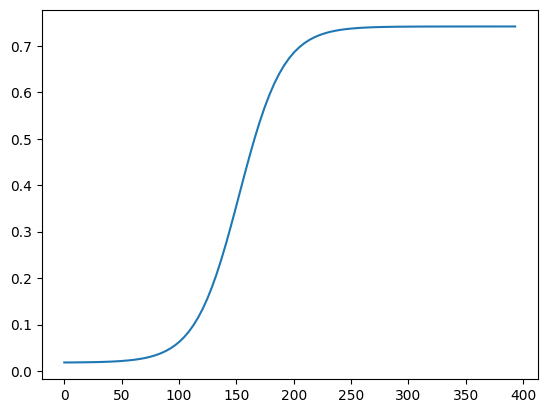

In [ ]:
#@title [aux] Understanding the pdockq curve
import numpy as np
import seaborn as sns

contact_space = np.linspace(1, 50,num = 100)
plddt_space = np.linspace(0,100, num=100)

#pDockQ fitted parameters per literature
L = 0.724
X0 = 152.611
k = 0.052
b = 0.018

# get average plddt * log(interface contact)
X = np.multiply(plddt_space, np.log(contact_space+1)) #+1 to prevent Nan
loss = np.divide(L, 1 + np.exp(-k*(X - X0))) + b

sns.lineplot(x = X, y=loss)

# [2.3] Experiment 2.3: Removing Sigmoid function from PDOCKQ

In [ ]:
#@title [LOSS] plddt x log(IF contact) Loss Function
import jax.numpy as jnp

def plddt_logif(outputs, aux):
  bL = binder_len
  plddt = aux['plddt'][-bL:]
  avg_plddt = jnp.multiply(jnp.mean(plddt),100)

  # calculte # of contact
  i_cmap_binder = aux['i_cmap'][-bL:,:]
  i_cmap_flatten = jnp.ravel(i_cmap_binder)
  contact_count = jnp.sum(jnp.where(i_cmap_flatten >= 0.95,i_cmap_flatten,0))
  #jax.debug.print("contact_count: {}",contact_count) #debug

  # get average plddt * log(interface contact)
  loss = jnp.multiply(avg_plddt, jnp.log(contact_count+1))*-1 #+1 to prevent Nan
  #jax.debug.print("X: {}",X) #debug
  return {"custom_loss":loss}

In [ ]:
#@title Experiment Run 3: set-up

import re

#Cyclic offset & fixed model params
cyclic_offset = True
bugfix = True
use_multimer = True  #use alphafold-multimer for design
control = True #set a control for hotspot with no hotspot

#enter PDB code or UniProt code (to fetch AlphaFoldDB model) or leave blink to upload your own
pdb = "6V0R"
target_chain = "A"

#allow backbone of target structure to be flexible
target_flexible = False

# Binder configurations
binder_len = 13
binder_seq = ""
binder_seq = re.sub("[^A-Z]", "", binder_seq.upper())
if len(binder_seq) > 0:
  binder_len = len(binder_seq)
else:
  binder_seq = None

# num models used
num_recycles = 0
num_models = "1"
num_models = 5 if num_models == "all" else int(num_models)

 #@title Experiment 1: setup
target_hotspot = ""
if target_hotspot == "": target_hotspot = None

#Configure parameters
HIV_hotspot = {"pdb_filename":pdb,
     "chain":target_chain,
     "binder_len":binder_len,
     "hotspot":target_hotspot,
     "use_multimer":use_multimer,
     "rm_target_seq":target_flexible}

#set models
HIV_hotspot["pdb_filename"] = get_pdb(HIV_hotspot["pdb_filename"])

#set HIV hotspot
if "x_prev" not in dir() or HIV_hotspot != x_prev:
  clear_mem()
  model_1 = mk_afdesign_model(
    protocol="binder",
    use_multimer=HIV_hotspot["use_multimer"],
    num_recycles=num_recycles,
    recycle_mode="sample",
    loss_callback=plddt_logif
  )
  model_1.prep_inputs(
    **HIV_hotspot,
    ignore_missing=False
  )
  x_prev = copy_dict(HIV_hotspot)
  print("target length:", model_1._target_len)
  print("binder length:", model_1._binder_len)
  bL = binder_len = model_1._binder_len

# Set cyclic offset
if cyclic_offset:
  if bugfix:
      print("Set bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.")
      add_cyclic_offset(model_1, bug_fix=True)
  else:
      print("Set not bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.")
      add_cyclic_offset(model_1, bug_fix=False)
else:
  print("Don't set cyclic offset. The linear peptide binder will be hallucinated.")


#learning param
optimizer = "pssm_semigreedy"
GD_method = "sgd"
learning_rate = 0.1
norm_seq_grad = True
dropout = True

# set seed
SEED = 20

#set seed & model params
model_1.restart(seq=binder_seq, seed = SEED)
model_1.set_optimizer(optimizer=GD_method,
                    learning_rate=learning_rate,
                    norm_seq_grad=norm_seq_grad)
models = model_1._model_names[:num_models]

#change weights
model_1.set_weights(i_con = 1.0,plddt=1.0)
model_1.opt['weights']['plddt_logif'] = 1.0
print(model_1.opt)

Set bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.
{'alpha': 2.0, 'con': {'binary': False, 'cutoff': 14.0, 'num': 2, 'num_pos': inf, 'seqsep': 9}, 'dropout': True, 'fape_cutoff': 10.0, 'hard': 0.0, 'i_con': {'binary': False, 'cutoff': 21.6875, 'num': 1, 'num_pos': inf}, 'learning_rate': 0.1, 'norm_seq_grad': True, 'num_models': 1, 'num_recycles': 0, 'pssm_hard': True, 'sample_models': True, 'soft': 0.0, 'temp': 1.0, 'template': {'rm_ic': False}, 'weights': {'con': 0.0, 'exp_res': 0.0, 'helix': 0.0, 'i_con': 1.0, 'i_pae': 0.0, 'pae': 0.0, 'plddt': 1.0, 'plddt_logif': 1.0, 'seq_ent': 0.0}}


In [ ]:
#@title Experiment 3.1: SEED 20 trial run with 1.0 logif
flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}

if optimizer == "pssm_semigreedy":
  model_1.design_pssm_semigreedy(120, 32, **flags)
  pssm = softmax(model_1._tmp["seq_logits"],1)

model_1.save_pdb(f"pdockq-loss_weight_{pdb}_mixW_adamw_seed{SEED}.pdb")

#Store results
log_wPDQ = model_1._tmp
param_wPDQ = model_1.opt
aux_wPDQ = model_1.aux
callback_wPDQ = model_1._callbacks

#binder plddt
bL = model_1._binder_len
binder_plddt_wPDQ = aux_wPDQ['plddt'][-bL:]

Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss -125.13 i_con 4.42 plddt 0.25 ptm 0.84 i_ptm 0.19 custom_loss -130.30
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss -141.29 i_con 4.13 plddt 0.28 ptm 0.84 i_ptm 0.27 custom_loss -146.13
3 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss -149.81 i_con 4.13 plddt 0.30 ptm 0.86 i_ptm 0.26 custom_loss -154.64
4 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss -138.04 i_con 4.20 plddt 0.28 ptm 0.84 i_ptm 0.26 custom_loss -142.97
5 models [0] recycles 0 hard 0 soft 0.04 temp 1 loss -131.35 i_con 4.13 plddt 0.27 ptm 0.85 i_ptm 0.26 custom_loss -136.22
6 models [0] recycles 0 hard 0 soft 0.05 temp 1 loss -141.90 i_con 4.20 plddt 0.29 ptm 0.85 i_ptm 0.25 custom_loss -146.81
7 models [0] recycles 0 hard 0 soft 0.06 temp 1 loss -140.53 i_con 4.16 plddt 0.28 ptm 0.86 i_ptm 0.25 custom_loss -145.41
8 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss -140.76 i_con 4.17 plddt 0.28 ptm 0.85 i_ptm 0.25 cus

In [ ]:
# display run1:i_con = 1, plddt = 0.5
color = "chain" #@param ["chain", "pLDDT", "rainbow"]
show_sidechains = False #@param {type:"boolean"}
show_mainchains = True #@param {type:"boolean"}
color_HP = True #@param {type:"boolean"}
animate = True #@param {type:"boolean"}
model_1.plot_pdb(show_sidechains=show_sidechains,
               show_mainchains=show_mainchains,
               color=color, color_HP=color_HP, animate=animate)
model_1.get_seqs()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

['VIEKFGLAGFKPE']

In [ ]:
import pickle
mixw2_save = {'weight':{'i_con':1.0, 'plddt':0.1, 'logif':1,'plddt':1},
           'log': log_wPDQ,
           'param': param_wPDQ,
           'aux': aux_wPDQ}

filename = f'6V0R_1plddt_1logif_sgd_seed{SEED}.pickle'
with open(filename, 'wb') as handle:
    pickle.dump(mixw2_save, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
#@title Experiment 3.2: Generate for remaining seeds: 23,25,26,27
import pickle
SEEDS = [23,25,26,27]
for SEED in SEEDS:
  #set seed & model params
  model_1.restart(seq=binder_seq, seed = SEED)
  model_1.set_optimizer(optimizer=GD_method,
                      learning_rate=learning_rate,
                      norm_seq_grad=norm_seq_grad)
  models = model_1._model_names[:num_models]

  #change weights
  model_1.set_weights(i_con = 1.0,plddt=1.0)
  model_1.opt['weights']['plddt_logif'] = 1.0
  print(model_1.opt)
  flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}

  #run model
  if optimizer == "pssm_semigreedy":
    model_1.design_pssm_semigreedy(120, 32, **flags)
    pssm = softmax(model_1._tmp["seq_logits"],1)

  model_1.save_pdb(f"pdockq-loss_weight_{pdb}_logif_seed{SEED}.pdb")

  #Store results
  log_wPDQ = model_1._tmp
  param_wPDQ = model_1.opt
  aux_wPDQ = model_1.aux
  callback_wPDQ = model_1._callbacks

  #save to pickle
  mixw2_save = {'weight':param_wPDQ['weights'],
           'log': log_wPDQ,
           'param': param_wPDQ,
           'aux': aux_wPDQ}

  filename = f'6V0R_1plddt_1logif_sgd_seed{SEED}.pickle'
  with open(filename, 'wb') as handle:
      pickle.dump(mixw2_save, handle, protocol=pickle.HIGHEST_PROTOCOL)

{'alpha': 2.0, 'con': {'binary': False, 'cutoff': 14.0, 'num': 2, 'num_pos': inf, 'seqsep': 9}, 'dropout': True, 'fape_cutoff': 10.0, 'hard': 0.0, 'i_con': {'binary': False, 'cutoff': 21.6875, 'num': 1, 'num_pos': inf}, 'learning_rate': 0.1, 'norm_seq_grad': True, 'num_models': 1, 'num_recycles': 0, 'pssm_hard': True, 'sample_models': True, 'soft': 0.0, 'temp': 1.0, 'template': {'rm_ic': False}, 'weights': {'con': 0.0, 'exp_res': 0.0, 'helix': 0.0, 'i_con': 1.0, 'i_pae': 0.0, 'pae': 0.0, 'plddt': 1.0, 'plddt_logif': 1.0, 'seq_ent': 0.0}}
Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss -135.06 i_con 4.28 plddt 0.27 ptm 0.85 i_ptm 0.23 custom_loss -140.07
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss -147.18 i_con 4.21 plddt 0.30 ptm 0.85 i_ptm 0.23 custom_loss -152.09
3 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss -146.57 i_con 4.13 plddt 0.29 ptm 0.85 i_ptm 0.27 custom_loss -151.41
4 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss -

# [2.4] Analyze run results of Experiment 2

In [ ]:
%cd custom-loss-experiments
%ls

[Errno 2] No such file or directory: 'custom-loss-experiments'
/content/drive/MyDrive/AFDesign/custom-loss-experiments
 6V0R_1plddt_1logif_sgd_seed20.pickle   pdockq-loss_weight_6V0R_icon1_pdockq0.1_seed20.pdb
 6V0R_1plddt_1logif_sgd_seed23.pickle   pdockq-loss_weight_6V0R_icon1_pdockq0.1_seed21.pdb
 6V0R_1plddt_1logif_sgd_seed25.pickle   pdockq-loss_weight_6V0R_icon1_pdockq0.1_seed23.pdb
 6V0R_1plddt_1logif_sgd_seed26.pickle   pdockq-loss_weight_6V0R_icon1_pdockq0.1_seed25.pdb
 6V0R_1plddt_1logif_sgd_seed27.pickle   pdockq-loss_weight_6V0R_icon1_pdockq0.1_seed26.pdb
 6V0R_mix_weight_adamw_seed20.pickle    pdockq-loss_weight_6V0R_icon1_pdockq0.1_seed27.pdb
 6V0R.pdb                               pdockq-loss_weight_6V0R_icon1_pdockq0.5_seed20.pdb
 6V0R_PDQw0_seed20.pickle               pdockq-loss_weight_6V0R_icon1_pdockq0.5_seed21.pdb
 6V0R_PDQw0_seed21.pickle               pdockq-loss_weight_6V0R_icon1_pdockq0.5_seed23.pdb
 6V0R_PDQw0_seed23.pickle               pdockq-loss_weight_6V0

In [ ]:
 #load results
import pickle
import os

# init
dir = os.getcwd()
get_pickled = {}

for filename in os.listdir(dir):
    if filename.endswith('.pickle'):
      var_name = os.path.splitext(filename)[0]
      file_path = os.path.join(dir,filename)
      print(f"Processing: {file_path}")
      try:
        with open(file_path,'rb') as f:
          get_pickled[var_name] = pickle.load(f)
      except Exception as e:
        print(f"Error with: {file_path} : {e}")

Processing: /content/drive/MyDrive/AFDesign/custom-loss-experiments/6V0R_w0_seed20.pickle
Processing: /content/drive/MyDrive/AFDesign/custom-loss-experiments/6V0R_w1_seed20.pickle
Processing: /content/drive/MyDrive/AFDesign/custom-loss-experiments/6V0R_w2_seed20.pickle
Processing: /content/drive/MyDrive/AFDesign/custom-loss-experiments/6V0R_w0_seed23.pickle
Processing: /content/drive/MyDrive/AFDesign/custom-loss-experiments/6V0R_w1_seed23.pickle
Processing: /content/drive/MyDrive/AFDesign/custom-loss-experiments/6V0R_w2_seed23.pickle
Processing: /content/drive/MyDrive/AFDesign/custom-loss-experiments/6V0R_w0_seed25.pickle
Processing: /content/drive/MyDrive/AFDesign/custom-loss-experiments/6V0R_w1_seed25.pickle
Processing: /content/drive/MyDrive/AFDesign/custom-loss-experiments/6V0R_w2_seed25.pickle
Processing: /content/drive/MyDrive/AFDesign/custom-loss-experiments/6V0R_w0_seed26.pickle
Processing: /content/drive/MyDrive/AFDesign/custom-loss-experiments/6V0R_w1_seed26.pickle
Processing

In [ ]:
#load charts
w0_seed20 = get_pickled['6V0R_w0_seed20']
w1_seed20 = get_pickled['6V0R_w1_seed20']
w2_seed20 = get_pickled['6V0R_w2_seed20']
w0_seed20_pdock = get_pickled['6V0R_PDQw0_seed20']
w1_seed20_pdock = get_pickled['6V0R_PDQw1_seed20']
w2_seed20_pdock = get_pickled['6V0R_PDQw2_seed20']
w0_seed23 = get_pickled['6V0R_w0_seed23']
w1_seed23 = get_pickled['6V0R_w1_seed23']
w2_seed23 = get_pickled['6V0R_w2_seed23']
w0_seed23_pdock = get_pickled['6V0R_PDQw0_seed23']
w1_seed23_pdock = get_pickled['6V0R_PDQw1_seed23']
w2_seed23_pdock = get_pickled['6V0R_PDQw2_seed23']
w0_seed25 = get_pickled['6V0R_w0_seed25']
w1_seed25 = get_pickled['6V0R_w1_seed25']
w2_seed25 = get_pickled['6V0R_w2_seed25']
w0_seed25_pdock = get_pickled['6V0R_PDQw0_seed25']
w1_seed25_pdock = get_pickled['6V0R_PDQw1_seed25']
w2_seed25_pdock = get_pickled['6V0R_PDQw2_seed25']
w0_seed26 = get_pickled['6V0R_w0_seed26']
w1_seed26 = get_pickled['6V0R_w1_seed26']
w2_seed26 = get_pickled['6V0R_w2_seed26']
w0_seed26_pdock = get_pickled['6V0R_PDQw0_seed26']
w1_seed26_pdock = get_pickled['6V0R_PDQw1_seed26']
w2_seed26_pdock = get_pickled['6V0R_PDQw2_seed26']
w0_seed27 = get_pickled['6V0R_w0_seed27']
w1_seed27 = get_pickled['6V0R_w1_seed27']
w2_seed27 = get_pickled['6V0R_w2_seed27']
w0_seed27_pdock = get_pickled['6V0R_PDQw0_seed27']
w1_seed27_pdock = get_pickled['6V0R_PDQw1_seed27']
w2_seed27_pdock = get_pickled['6V0R_PDQw2_seed27']
wlogif_seed20 = get_pickled['6V0R_1plddt_1logif_sgd_seed20']
wlogif_seed23 = get_pickled['6V0R_1plddt_1logif_sgd_seed23']
wlogif_seed25 = get_pickled['6V0R_1plddt_1logif_sgd_seed25']
wlogif_seed26 = get_pickled['6V0R_1plddt_1logif_sgd_seed26']
wlogif_seed27 = get_pickled['6V0R_1plddt_1logif_sgd_seed27']

In [ ]:
w1_seed23_pdock['param']['weights']

{'con': 0.0,
 'exp_res': 0.0,
 'helix': 0.0,
 'i_con': 1.0,
 'i_pae': 0.0,
 'pDockQ': 0.5,
 'pae': 0.0,
 'plddt': 0.1,
 'seq_ent': 0.0}

<Axes: >

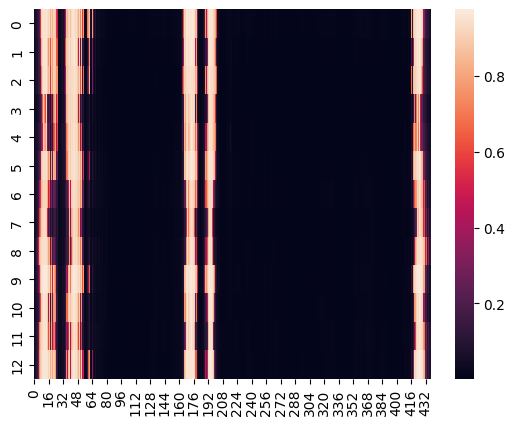

In [ ]:
bL = 13
bin_plddt = w0_seed20['aux']['plddt'][-bL:]
bin_cmap = w0_seed20['aux']['i_cmap'][-bL:,:-bL]
sns.heatmap(bin_cmap)


In [ ]:
#avg_plddt = np.mean(bin_plddt)
avg_plddt = 0.5
#contact_no = np.sum(bin_cmap)
contact_no = 500
X = avg_plddt*np.log10(contact_no)


#pDock Score
def calc_pdockq(X):
  L = 0.724
  X0 = 152.611
  k = 0.052
  b = 0.018
  return (L/(1+ np.exp(-k*(X-X0)))) + b

print(pdockq)
print(X)

<Axes: >

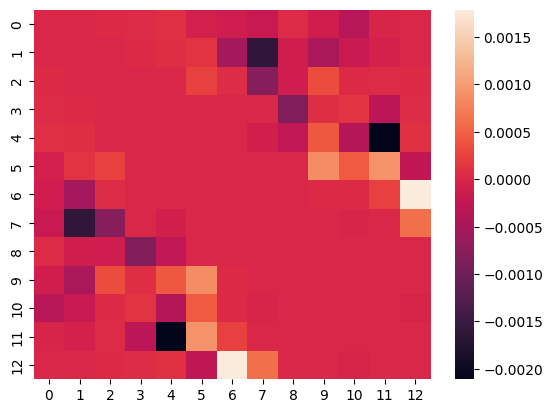

In [ ]:
# i_cmap differential between w1 vs w0
bL = 13
sns.heatmap(w1_seed20['aux']['i_cmap'][-bL:,-bL:] - w0_seed20['aux']['i_cmap'][-bL:,-bL:])

<Axes: >

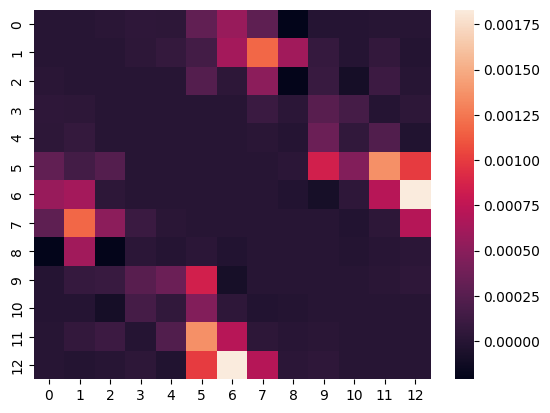

In [ ]:
# i_cmap differential between w2 vs w0
sns.heatmap(w2_seed20['aux']['i_cmap'][-bL:,-bL:] - w0_seed20['aux']['i_cmap'][-bL:,-bL:])

<Axes: >

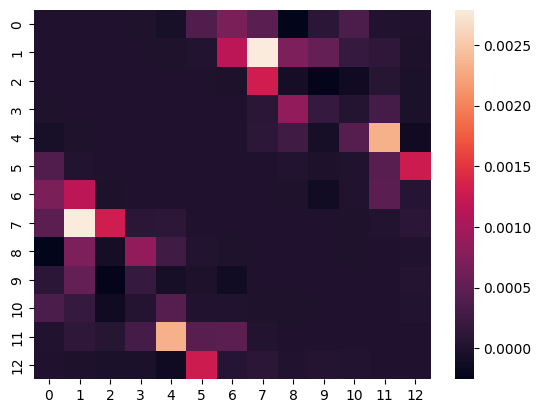

In [ ]:
# i_cmap differential between w2 vs w1
sns.heatmap(w2_seed20['aux']['i_cmap'][-bL:,-bL:] - w1_seed20['aux']['i_cmap'][-bL:,-bL:])

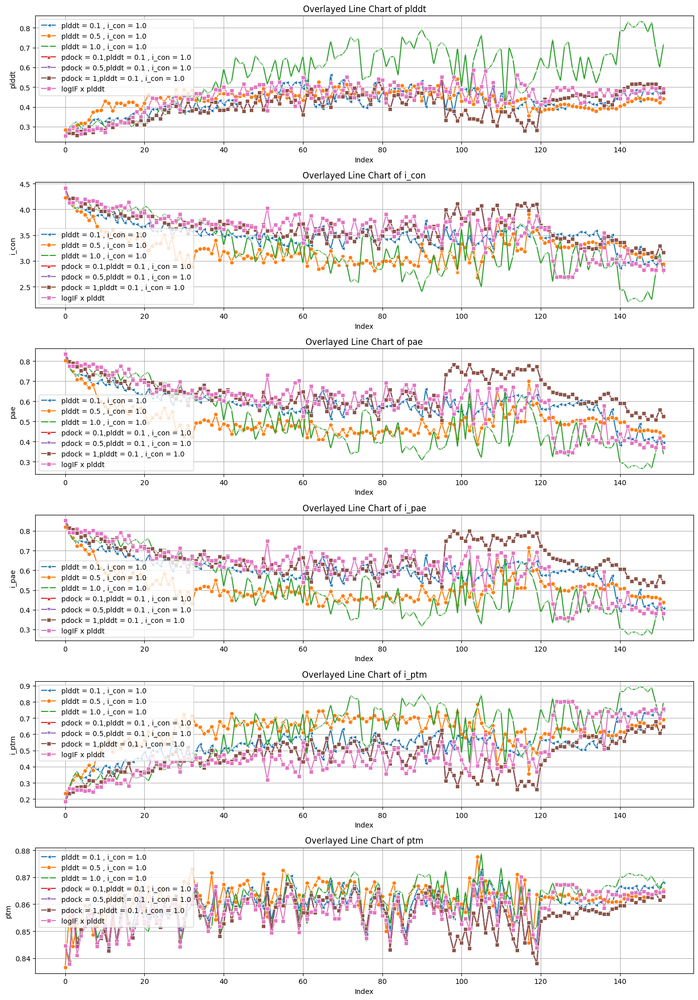

In [ ]:
#@title training charts for seed20
w1_training_seq = pd.DataFrame(w1_seed20['log']['log'])
w2_training_seq = pd.DataFrame(w2_seed20['log']['log'])
w0_training_seq = pd.DataFrame(w0_seed20['log']['log'])
w0_training_seq_pdock = pd.DataFrame(w0_seed20_pdock['log']['log'])
w1_training_seq_pdock = pd.DataFrame(w1_seed20_pdock['log']['log'])
w2_training_seq_pdock = pd.DataFrame(w2_seed20_pdock['log']['log'])
wlogif_training_seq = pd.DataFrame(wlogif_seed20['log']['log'])
# List of columns to plot
columns_to_plot = ['plddt', 'i_con', 'pae','i_pae','i_ptm','ptm']

# Create a figure with subplots
fig, axes = plt.subplots(nrows=len(columns_to_plot), figsize=(14, 20))

for ax, col in zip(axes, columns_to_plot):
    sns.lineplot(data=w0_training_seq, x=w2_training_seq.index, y=col, marker='<', label='plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w1_training_seq, x=w1_training_seq.index, y=col, marker='o', label='plddt = 0.5 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w2_training_seq, x=w2_training_seq.index, y=col, marker='x', label='plddt = 1.0 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w0_training_seq_pdock, x=w0_training_seq_pdock.index, y=col, marker='^', label='pdock = 0.1,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w1_training_seq_pdock, x=w1_training_seq_pdock.index, y=col, marker='v', label='pdock = 0.5,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w2_training_seq_pdock, x=w2_training_seq_pdock.index, y=col, marker='s', label='pdock = 1,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=wlogif_training_seq, x=wlogif_training_seq.index, y=col, marker='s', label='logIF x plddt', ax=ax)
    ax.set_title(f'Overlayed Line Chart of {col}')
    ax.set_xlabel('Index')
    ax.set_ylabel(col)
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

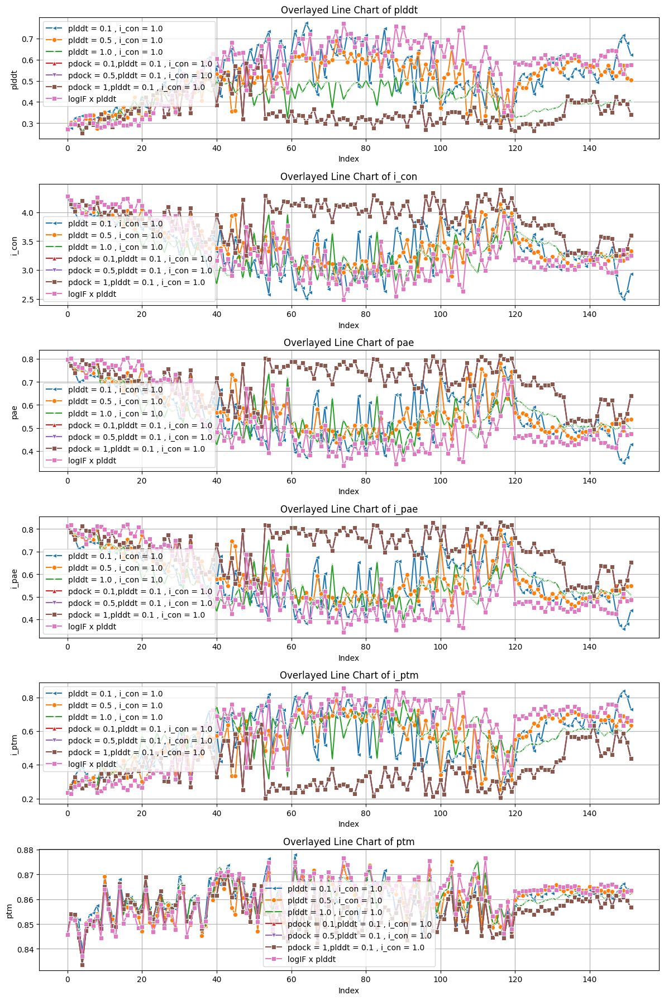

In [ ]:
#@title training charts for seed23
w1_training_seq = pd.DataFrame(w1_seed23['log']['log'])
w2_training_seq = pd.DataFrame(w2_seed23['log']['log'])
w0_training_seq = pd.DataFrame(w0_seed23['log']['log'])
w0_training_seq_pdock = pd.DataFrame(w0_seed23_pdock['log']['log'])
w1_training_seq_pdock = pd.DataFrame(w1_seed23_pdock['log']['log'])
w2_training_seq_pdock = pd.DataFrame(w2_seed23_pdock['log']['log'])
wlogif_training_seq = pd.DataFrame(wlogif_seed23['log']['log'])
# List of columns to plot
columns_to_plot = ['plddt', 'i_con', 'pae','i_pae','i_ptm','ptm']


# Create a figure with subplots
fig, axes = plt.subplots(nrows=len(columns_to_plot), figsize=(12, 18))

for ax, col in zip(axes, columns_to_plot):
    sns.lineplot(data=w0_training_seq, x=w2_training_seq.index, y=col, marker='<', label='plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w1_training_seq, x=w1_training_seq.index, y=col, marker='o', label='plddt = 0.5 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w2_training_seq, x=w2_training_seq.index, y=col, marker='x', label='plddt = 1.0 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w0_training_seq_pdock, x=w0_training_seq_pdock.index, y=col, marker='^', label='pdock = 0.1,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w1_training_seq_pdock, x=w1_training_seq_pdock.index, y=col, marker='v', label='pdock = 0.5,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w2_training_seq_pdock, x=w2_training_seq_pdock.index, y=col, marker='s', label='pdock = 1,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=wlogif_training_seq, x=wlogif_training_seq.index, y=col, marker='s', label='logIF x plddt', ax=ax)
    ax.set_title(f'Overlayed Line Chart of {col}')
    ax.set_xlabel('Index')
    ax.set_ylabel(col)
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

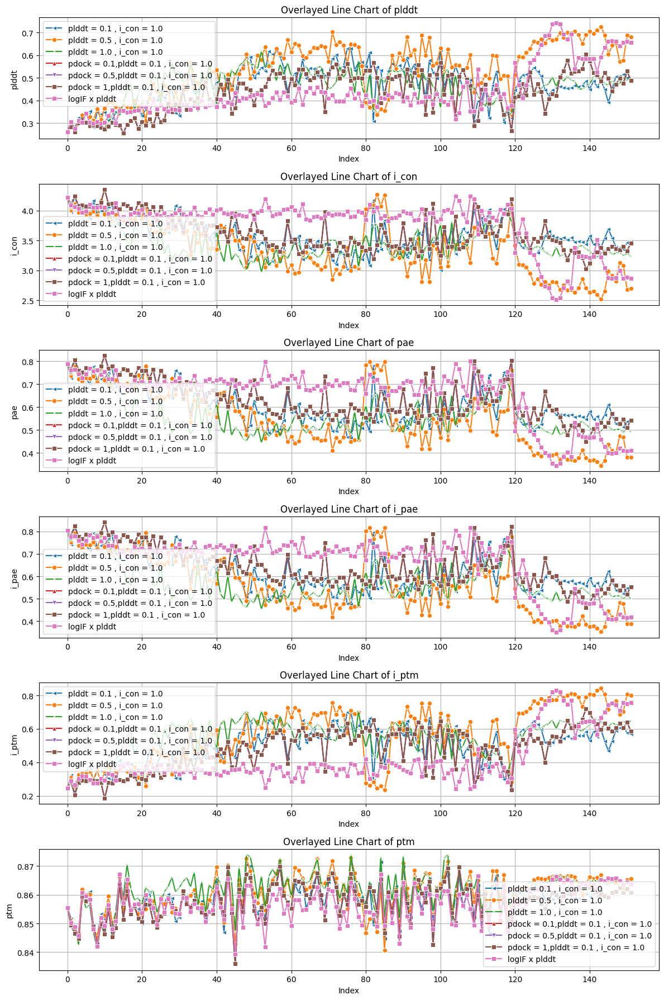

In [ ]:
#@title training charts for seed25
w1_training_seq = pd.DataFrame(w1_seed25['log']['log'])
w2_training_seq = pd.DataFrame(w2_seed25['log']['log'])
w0_training_seq = pd.DataFrame(w0_seed25['log']['log'])
w0_training_seq_pdock = pd.DataFrame(w0_seed25_pdock['log']['log'])
w1_training_seq_pdock = pd.DataFrame(w1_seed25_pdock['log']['log'])
w2_training_seq_pdock = pd.DataFrame(w2_seed25_pdock['log']['log'])
wlogif_training_seq = pd.DataFrame(wlogif_seed25['log']['log'])
# List of columns to plot
columns_to_plot = ['plddt', 'i_con', 'pae','i_pae','i_ptm','ptm']


# Create a figure with subplots
fig, axes = plt.subplots(nrows=len(columns_to_plot), figsize=(12, 18))

for ax, col in zip(axes, columns_to_plot):
    sns.lineplot(data=w0_training_seq, x=w2_training_seq.index, y=col, marker='<', label='plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w1_training_seq, x=w1_training_seq.index, y=col, marker='o', label='plddt = 0.5 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w2_training_seq, x=w2_training_seq.index, y=col, marker='x', label='plddt = 1.0 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w0_training_seq_pdock, x=w0_training_seq_pdock.index, y=col, marker='^', label='pdock = 0.1,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w1_training_seq_pdock, x=w1_training_seq_pdock.index, y=col, marker='v', label='pdock = 0.5,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w2_training_seq_pdock, x=w2_training_seq_pdock.index, y=col, marker='s', label='pdock = 1,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=wlogif_training_seq, x=wlogif_training_seq.index, y=col, marker='s', label='logIF x plddt', ax=ax)
    ax.set_title(f'Overlayed Line Chart of {col}')
    ax.set_xlabel('Index')
    ax.set_ylabel(col)
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

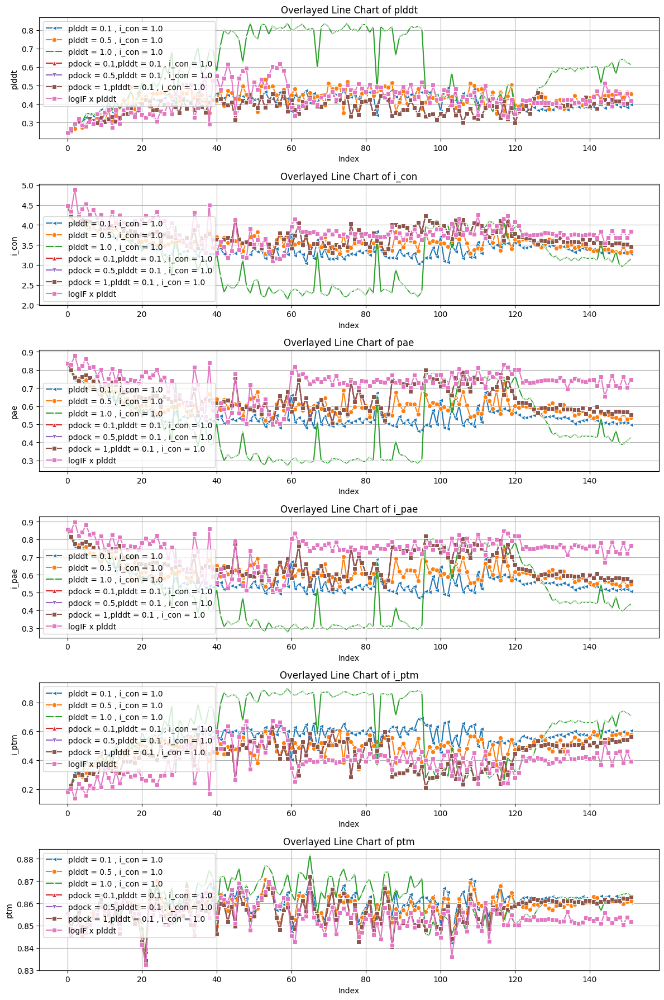

In [ ]:
#@title training charts for seed26
w1_training_seq = pd.DataFrame(w1_seed26['log']['log'])
w2_training_seq = pd.DataFrame(w2_seed26['log']['log'])
w0_training_seq = pd.DataFrame(w0_seed26['log']['log'])
w0_training_seq_pdock = pd.DataFrame(w0_seed26_pdock['log']['log'])
w1_training_seq_pdock = pd.DataFrame(w1_seed26_pdock['log']['log'])
w2_training_seq_pdock = pd.DataFrame(w2_seed26_pdock['log']['log'])
wlogif_training_seq = pd.DataFrame(wlogif_seed26['log']['log'])
# List of columns to plot
columns_to_plot = ['plddt', 'i_con', 'pae','i_pae','i_ptm','ptm']


# Create a figure with subplots
fig, axes = plt.subplots(nrows=len(columns_to_plot), figsize=(12, 18))

for ax, col in zip(axes, columns_to_plot):
    sns.lineplot(data=w0_training_seq, x=w2_training_seq.index, y=col, marker='<', label='plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w1_training_seq, x=w1_training_seq.index, y=col, marker='o', label='plddt = 0.5 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w2_training_seq, x=w2_training_seq.index, y=col, marker='x', label='plddt = 1.0 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w0_training_seq_pdock, x=w0_training_seq_pdock.index, y=col, marker='^', label='pdock = 0.1,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w1_training_seq_pdock, x=w1_training_seq_pdock.index, y=col, marker='v', label='pdock = 0.5,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w2_training_seq_pdock, x=w2_training_seq_pdock.index, y=col, marker='s', label='pdock = 1,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=wlogif_training_seq, x=wlogif_training_seq.index, y=col, marker='s', label='logIF x plddt', ax=ax)
    ax.set_title(f'Overlayed Line Chart of {col}')
    ax.set_xlabel('Index')
    ax.set_ylabel(col)
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

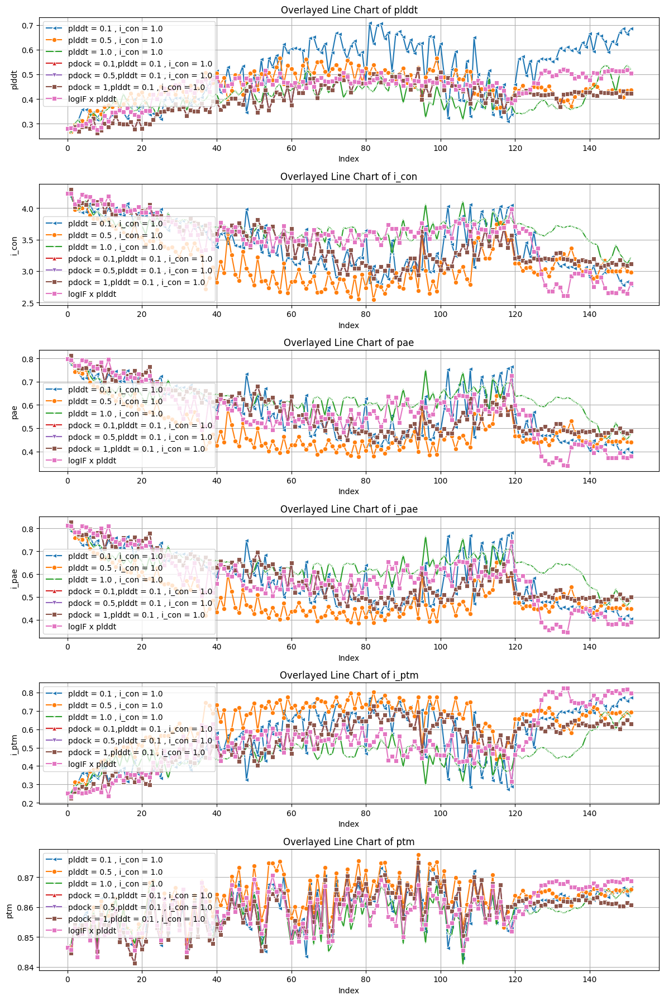

In [ ]:
#@title training charts for seed27
w1_training_seq = pd.DataFrame(w1_seed27['log']['log'])
w2_training_seq = pd.DataFrame(w2_seed27['log']['log'])
w0_training_seq = pd.DataFrame(w0_seed27['log']['log'])
w0_training_seq_pdock = pd.DataFrame(w0_seed27_pdock['log']['log'])
w1_training_seq_pdock = pd.DataFrame(w1_seed27_pdock['log']['log'])
w2_training_seq_pdock = pd.DataFrame(w2_seed27_pdock['log']['log'])
wlogif_training_seq = pd.DataFrame(wlogif_seed27['log']['log'])
# List of columns to plot
columns_to_plot = ['plddt', 'i_con', 'pae','i_pae','i_ptm','ptm']

# Create a figure with subplots
fig, axes = plt.subplots(nrows=len(columns_to_plot), figsize=(12, 18))

for ax, col in zip(axes, columns_to_plot):
    sns.lineplot(data=w0_training_seq, x=w2_training_seq.index, y=col, marker='<', label='plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w1_training_seq, x=w1_training_seq.index, y=col, marker='o', label='plddt = 0.5 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w2_training_seq, x=w2_training_seq.index, y=col, marker='x', label='plddt = 1.0 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w0_training_seq_pdock, x=w0_training_seq_pdock.index, y=col, marker='^', label='pdock = 0.1,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w1_training_seq_pdock, x=w1_training_seq_pdock.index, y=col, marker='v', label='pdock = 0.5,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=w2_training_seq_pdock, x=w2_training_seq_pdock.index, y=col, marker='s', label='pdock = 1,plddt = 0.1 , i_con = 1.0', ax=ax)
    sns.lineplot(data=wlogif_training_seq, x=wlogif_training_seq.index, y=col, marker='s', label='logIF x plddt', ax=ax)
    ax.set_title(f'Overlayed Line Chart of {col}')
    ax.set_xlabel('Index')
    ax.set_ylabel(col)
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
#@title Compare model weights across seeds
dfs = []
# loop through keys to concat dfs
for key in get_pickled.keys():
  seed = int(key.split('seed')[1].split('_')[0])
  weight = key.split('_')[1]
  logif = False
  if "PDQ" in key: # assign if pdock is val or not
    if weight.split('w')[1] == '0':
      pdock = '0.1'
    elif weight.split('w')[1] == '1':
      pdock = '0.5'
    elif weight.split('w')[1] == '2':
      pdock = '1.0'
  elif "logif" in key:
    logif = True
    pdock = '0.0'
    weight = 'logif'
  else:
    pdock = '0.0'
  #assign df
  df = pd.DataFrame(get_pickled[key]['log']['log'])
  df['seed'] = seed
  df['weight'] = weight
  df['pdock'] = pdock
  df['file'] = key
  df['index'] = df.index
  df['logif'] = logif

  #append df
  dfs.append(df)

# Concatenate all DataFrames in the list into a single DataFrame
results_df = pd.concat(dfs, ignore_index=True)  # Ignore index to reset the index

#procss deltas
columns_to_compare = ['plddt', 'i_con', 'pae','i_pae','loss','i_ptm','ptm']
df_control = results_df[results_df['weight'] == 'w0'][['seed','plddt', 'i_con', 'pae','i_pae','loss','i_ptm','ptm']]
df_pdock_nonzero = results_df[results_df['weight'] != 'w0']
merged_df = pd.merge(df_control, df_pdock_nonzero, on=['seed'], suffixes=('_c', '_test'))

# columns to compare
for col in columns_to_compare:
    merged_df[col + '_delta'] = merged_df[col + '_test'] - merged_df[col + '_c']
delta_df = merged_df[['index','seed','weight','logif','pdock','file','plddt_delta', 'i_con_delta', 'pae_delta', 'i_pae_delta',\
                      'loss_delta', 'i_ptm_delta', 'ptm_delta']]

In [ ]:
delta_df

,index,seed,weight,logif,pdock,file,plddt_delta,i_con_delta,pae_delta,i_pae_delta,loss_delta,i_ptm_delta,ptm_delta
0,0,20,w1,False,0.0,6V0R_w1_seed20,0.029790,-0.193464,-0.031233,-0.032157,0.090143,0.049153,-0.008060
1,1,20,w1,False,0.0,6V0R_w1_seed20,0.017906,-0.264681,-0.058141,-0.059394,0.024868,0.082913,0.010766
2,2,20,w1,False,0.0,6V0R_w1_seed20,0.037388,-0.330418,-0.085301,-0.087601,-0.050610,0.131486,-0.000110
3,3,20,w1,False,0.0,6V0R_w1_seed20,0.054613,-0.443034,-0.125708,-0.128440,-0.171838,0.159600,0.008215
4,4,20,w1,False,0.0,6V0R_w1_seed20,0.062946,-0.466211,-0.120482,-0.123342,-0.199182,0.148838,0.008857
...,...,...,...,...,...,...,...,...,...,...,...,...,...
693115,147,27,logif,True,0.0,6V0R_1plddt_1logif_sgd_seed27,-0.172807,-0.125008,-0.022327,-0.022989,-313.749092,0.036846,0.002167
693116,148,27,logif,True,0.0,6V0R_1plddt_1logif_sgd_seed27,-0.172749,-0.050769,-0.000689,-0.001167,-316.316108,0.025241,0.001942
693117,149,27,logif,True,0.0,6V0R_1plddt_1logif_sgd_seed27,-0.171538,-0.097526,-0.021676,-0.022367,-325.047218,0.042420,0.002928
693118,150,27,logif,True,0.0,6V0R_1plddt_1logif_sgd_seed27,-0.168105,-0.129477,-0.024347,-0.025118,-327.764686,0.047465,0.002998


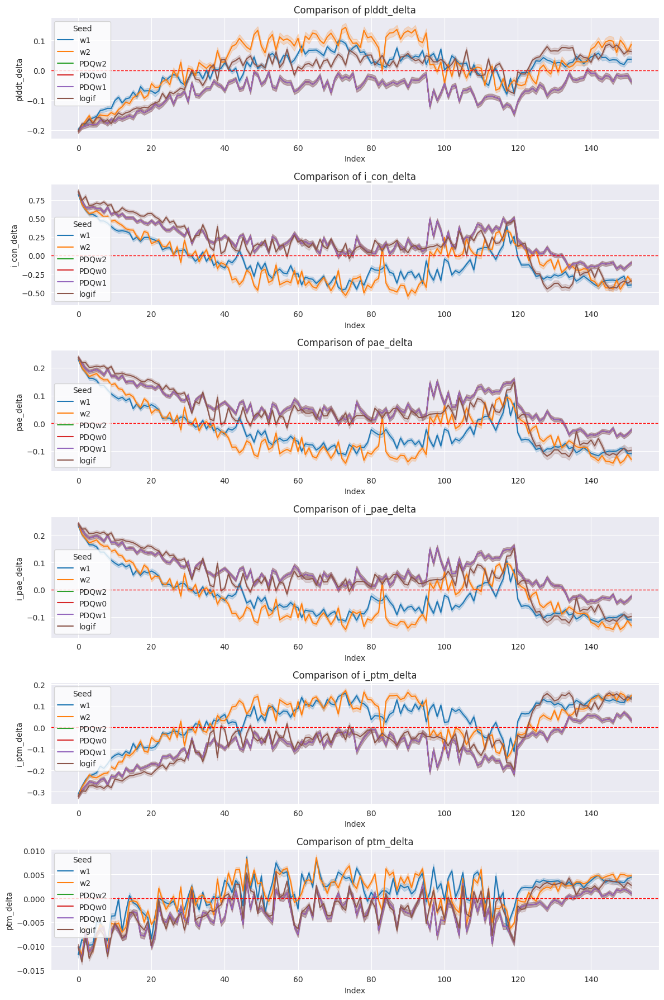

In [ ]:
columns_to_plot = ['plddt_delta', 'i_con_delta', 'pae_delta', 'i_pae_delta', 'i_ptm_delta', 'ptm_delta']

# Create subplots
fig, axes = plt.subplots(nrows=len(columns_to_plot), figsize=(12, 18))
sns.set_style("whitegrid")

# Loop through each column and create a plot in the corresponding subplot
for i, col in enumerate(columns_to_plot):
    sns.lineplot(
        data=delta_df,
        x=delta_df['index'],  # Use the index as the x-axis
        y=col,  # Column to be plotted on the y-axis
        hue='weight',  # Differentiate lines by the 'weight' column
        markers=True,  # Optionally add markers for each point
        dashes=False,  # Disable dashes for a cleaner look
        ax=axes[i]  # Plot on the correct subplot
    )
    # Customize each subplot
    axes[i].set_title(f'Comparison of {col}')
    axes[i].set_xlabel('Index')
    axes[i].set_ylabel(col)
    axes[i].legend(title='Seed', loc='best')
    axes[i].axhline(0, color='red', linestyle='--', linewidth=1)

plt.tight_layout()
plt.show()

# [3] Exploring generation to compare with experimental

In [ ]:
# set hotspots
target_hotspots = "69,108,109,112,113,116,117,121,202,255,256,257,370,375,376,377,382,384,424,425,426,427,428,429,432,433,434,475"
#target_hotspots = "398,176,395"
SEED_START = 50
SEED_END = 55

In [ ]:
#@title Experiment Run 3: set-up

import re

#Cyclic offset & fixed model params
cyclic_offset = True
bugfix = True
use_multimer = True  #use alphafold-multimer for design
control = True #set a control for hotspot with no hotspot

#allow backbone of target structure to be flexible
target_flexible = False

#enter PDB code or UniProt code (to fetch AlphaFoldDB model) or leave blink to upload your own
pdb = "6MU7"
target_chain = "G"

# Binder configurations
binder_len = 6
binder_seq = ""
binder_seq = re.sub("[^A-Z]", "", binder_seq.upper())
if len(binder_seq) > 0:
  binder_len = len(binder_seq)
else:
  binder_seq = None

# num models used
num_recycles = 0
num_models = "1"
num_models = 5 if num_models == "all" else int(num_models)

 #@title Experiment 1: setup
target_hotspot = ""
if target_hotspot == "": target_hotspot = None

#Configure parameters
HIV_hotspot = {"pdb_filename":pdb,
     "chain":target_chain,
     "binder_len":binder_len,
     "hotspot":target_hotspots,
     "use_multimer":use_multimer,
     "rm_target_seq":target_flexible}

#set models
HIV_hotspot["pdb_filename"] = get_pdb(HIV_hotspot["pdb_filename"])

#set HIV hotspot
if "x_prev" not in dir() or HIV_hotspot != x_prev:
  clear_mem()
  model_1 = mk_afdesign_model(
    protocol="binder",
    use_multimer=HIV_hotspot["use_multimer"],
    num_recycles=num_recycles,
    recycle_mode="sample"
  )
  model_1.prep_inputs(
    **HIV_hotspot,
    ignore_missing=False
  )
  x_prev = copy_dict(HIV_hotspot)
  print("target length:", model_1._target_len)
  print("binder length:", model_1._binder_len)
  bL = binder_len = model_1._binder_len

# Set cyclic offset
if cyclic_offset:
  if bugfix:
      print("Set bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.")
      add_cyclic_offset(model_1, bug_fix=True)
  else:
      print("Set not bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.")
      add_cyclic_offset(model_1, bug_fix=False)
else:
  print("Don't set cyclic offset. The linear peptide binder will be hallucinated.")


#learning param
optimizer = "pssm_semigreedy"
GD_method = "sgd"
learning_rate = 0.1
norm_seq_grad = True
dropout = True


AssertionError: ERROR: positions 400 and chain G not found

In [ ]:
#@title Experiment 3.2: Generate w/ hotspot w/ plddt 1.0 (trying to get close to experimental)
import pickle
SEEDS = range(SEED_START, SEED_END)
for SEED in SEEDS:
  #set seed & model params
  model_1.restart(seq=binder_seq, seed = SEED)
  model_1.set_optimizer(optimizer=GD_method,
                      learning_rate=learning_rate,
                      norm_seq_grad=norm_seq_grad)
  models = model_1._model_names[:num_models]

  #change weights
  model_1.set_weights(i_con = 1.0,plddt=1.0)
  model_1.opt['weights']['plddt_logif'] = 0.0
  print(model_1.opt)
  flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}

  #run model
  if optimizer == "pssm_semigreedy":
    model_1.design_pssm_semigreedy(120, 32, **flags)
    pssm = softmax(model_1._tmp["seq_logits"],1)

  model_1.save_pdb(f"Experimental_Recreation_{pdb}_Hotspot_PLDDT1_len{binder_len}_seed{SEED}.pdb")

  #Store intermedialy results
  log_wPDQ = model_1._tmp
  param_wPDQ = model_1.opt
  aux_wPDQ = model_1.aux
  callback_wPDQ = model_1._callbacks


# [DEV] Save intermediaries
'''
  #save to pickle
  mixw2_save = {'weight':param_wPDQ['weights'],
           'log': log_wPDQ,
           'param': param_wPDQ,
           'aux': aux_wPDQ}

  filename = f'{pdb}_1logif_sgd_seed{SEED}.pickle'
  with open(filename, 'wb') as handle:
      pickle.dump(mixw2_save, handle, protocol=pickle.HIGHEST_PROTOCOL)
'''

{'alpha': 2.0, 'con': {'binary': False, 'cutoff': 14.0, 'num': 2, 'num_pos': inf, 'seqsep': 9}, 'dropout': True, 'fape_cutoff': 10.0, 'hard': 0.0, 'hotspot': array([ 33,  72,  73,  76,  77,  80,  81,  85, 156, 209, 210, 211, 322,
       327, 328, 329, 334, 336, 366, 367, 368, 369, 370, 371, 374, 375,
       376, 411]), 'i_con': {'binary': False, 'cutoff': 21.6875, 'num': 1, 'num_pos': inf}, 'learning_rate': 0.1, 'norm_seq_grad': True, 'num_models': 1, 'num_recycles': 0, 'pssm_hard': True, 'sample_models': True, 'soft': 0.0, 'temp': 1.0, 'template': {'rm_ic': False}, 'weights': {'con': 0.0, 'exp_res': 0.0, 'helix': 0.0, 'i_con': 1.0, 'i_pae': 0.0, 'pae': 0.0, 'plddt': 1.0, 'seq_ent': 0.0, 'plddt_logif': 0.0}}
Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss 6.54 i_con 5.76 plddt 0.21 ptm 0.87 i_ptm 0.16
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss 6.09 i_con 5.44 plddt 0.35 ptm 0.87 i_ptm 0.13
3 models [0] recycles 0 hard 0 soft 0.03 temp 1 l

"\n  #save to pickle\n  mixw2_save = {'weight':param_wPDQ['weights'],\n           'log': log_wPDQ,\n           'param': param_wPDQ,\n           'aux': aux_wPDQ}\n\n  filename = f'{pdb}_1logif_sgd_seed{SEED}.pickle'\n  with open(filename, 'wb') as handle:\n      pickle.dump(mixw2_save, handle, protocol=pickle.HIGHEST_PROTOCOL)\n"



---



# [4] Modifying embedding locations


In [ ]:
# modify cyclic offset with repulsion in embedding
import numpy as np

def add_cyclic_offset_w_interaction(self, bug_fix=True,r_index = "", a_index = ""):
  '''add cyclic offset to connect N and C term'''
  def cyclic_offset(L):
    i = np.arange(L)
    ij = np.stack([i,i+L],-1)
    offset = i[:,None] - i[None,:]
    c_offset = np.abs(ij[:,None,:,None] - ij[None,:,None,:]).min((2,3))
    if bug_fix:
      a = c_offset < np.abs(offset)
      c_offset[a] = -c_offset[a]
    return c_offset * np.sign(offset)
  idx = self._inputs["residue_index"]
  offset = np.array(idx[:,None] - idx[None,:])

  if self.protocol == "binder":
    c_offset = cyclic_offset(self._binder_len)
    offset[self._target_len:,self._target_len:] = c_offset
    if r_index != "":
      indices = parse_indices(r_index)
      offset[self._target_len:,indices] = -self._target_len
      offset[indices,self._target_len:] = -self._target_len
    if a_index != "":
      indices = parse_indices(a_index)
      offset[self._target_len:,indices] = 1
      offset[indices,self._target_len:] = 1
  self._inputs["offset"] = offset

In [ ]:
#@title Experiment Run 4: set-up

import re

#Cyclic offset & fixed model params
cyclic_offset = True
bugfix = True
use_multimer = True  #use alphafold-multimer for design
control = True #set a control for hotspot with no hotspot

#allow backbone of target structure to be flexible
target_flexible = False

#enter PDB code or UniProt code (to fetch AlphaFoldDB model) or leave blink to upload your own
pdb = "6MU7"
target_chain = "G"

# Binder configurations
binder_len = 13
binder_seq = ""
binder_seq = re.sub("[^A-Z]", "", binder_seq.upper())
if len(binder_seq) > 0:
  binder_len = len(binder_seq)
else:
  binder_seq = None

# num models used
num_recycles = 0
num_models = "1"
num_models = 5 if num_models == "all" else int(num_models)

 #@title Experiment 1: setup
target_hotspot = ""
if target_hotspot == "": target_hotspot = None

#Configure parameters
HIV_hotspot = {"pdb_filename":pdb,
     "chain":target_chain,
     "binder_len":binder_len,
     "use_multimer":use_multimer,
     "rm_target_seq":target_flexible}

#set models
HIV_hotspot["pdb_filename"] = get_pdb(HIV_hotspot["pdb_filename"])

#set HIV hotspot
if "x_prev" not in dir() or HIV_hotspot != x_prev:
  clear_mem()
  model_1 = mk_afdesign_model(
    protocol="binder",
    use_multimer=HIV_hotspot["use_multimer"],
    num_recycles=num_recycles,
    recycle_mode="sample"
  )
  model_1.prep_inputs(
    **HIV_hotspot,
    ignore_missing=False
  )
  x_prev = copy_dict(HIV_hotspot)
  print("target length:", model_1._target_len)
  print("binder length:", model_1._binder_len)
  bL = binder_len = model_1._binder_len

# Set cyclic offset
if cyclic_offset:
  if bugfix:
      print("Set bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.")
      add_cyclic_offset_w_interaction(model_1, bug_fix=True, r_index = "10",a_index="25")
  else:
      print("Set not bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.")
      add_cyclic_offset_w_interaction(model_1, bug_fix=False,r_index = "10",a_index="25")
else:
  print("Don't set cyclic offset. The linear peptide binder will be hallucinated.")

#learning param
optimizer = "pssm_semigreedy"
GD_method = "sgd"
learning_rate = 0.1
norm_seq_grad = True
dropout = True
models = model_1._model_names[:num_models]

2024-11-07 04:22:50,551 - INFO - Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-11-07 04:22:50,555 - INFO - Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


target length: 441
binder length: 13
Set bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.


In [ ]:
model_1._inputs["offset"][:model_1._binder_len,:model_1._binder_len]

array([[  0,  -1,  -2,  -3,  -4,  -5,  -6,  -7,  -8,  -9, -10, -11, -12],
       [  1,   0,  -1,  -2,  -3,  -4,  -5,  -6,  -7,  -8,  -9, -10, -11],
       [  2,   1,   0,  -1,  -2,  -3,  -4,  -5,  -6,  -7,  -8,  -9, -10],
       [  3,   2,   1,   0,  -1,  -2,  -3,  -4,  -5,  -6,  -7,  -8,  -9],
       [  4,   3,   2,   1,   0,  -1,  -2,  -3,  -4,  -5,  -6,  -7,  -8],
       [  5,   4,   3,   2,   1,   0,  -1,  -2,  -3,  -4,  -5,  -6,  -7],
       [  6,   5,   4,   3,   2,   1,   0,  -1,  -2,  -3,  -4,  -5,  -6],
       [  7,   6,   5,   4,   3,   2,   1,   0,  -1,  -2,  -3,  -4,  -5],
       [  8,   7,   6,   5,   4,   3,   2,   1,   0,  -1,  -2,  -3,  -4],
       [  9,   8,   7,   6,   5,   4,   3,   2,   1,   0,  -1,  -2,  -3],
       [ 10,   9,   8,   7,   6,   5,   4,   3,   2,   1,   0,  -1,  -2],
       [ 11,  10,   9,   8,   7,   6,   5,   4,   3,   2,   1,   0,  -1],
       [ 12,  11,  10,   9,   8,   7,   6,   5,   4,   3,   2,   1,   0]])

In [ ]:
model_1._inputs["offset"][-13:,-13:]

array([[ 0, -1, -2, -3, -4, -5, -6,  6,  5,  4,  3,  2,  1],
       [ 1,  0, -1, -2, -3, -4, -5, -6,  6,  5,  4,  3,  2],
       [ 2,  1,  0, -1, -2, -3, -4, -5, -6,  6,  5,  4,  3],
       [ 3,  2,  1,  0, -1, -2, -3, -4, -5, -6,  6,  5,  4],
       [ 4,  3,  2,  1,  0, -1, -2, -3, -4, -5, -6,  6,  5],
       [ 5,  4,  3,  2,  1,  0, -1, -2, -3, -4, -5, -6,  6],
       [ 6,  5,  4,  3,  2,  1,  0, -1, -2, -3, -4, -5, -6],
       [-6,  6,  5,  4,  3,  2,  1,  0, -1, -2, -3, -4, -5],
       [-5, -6,  6,  5,  4,  3,  2,  1,  0, -1, -2, -3, -4],
       [-4, -5, -6,  6,  5,  4,  3,  2,  1,  0, -1, -2, -3],
       [-3, -4, -5, -6,  6,  5,  4,  3,  2,  1,  0, -1, -2],
       [-2, -3, -4, -5, -6,  6,  5,  4,  3,  2,  1,  0, -1],
       [-1, -2, -3, -4, -5, -6,  6,  5,  4,  3,  2,  1,  0]])

<Axes: >

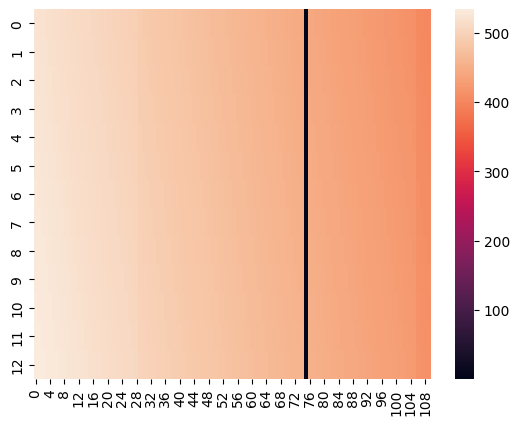

In [ ]:
sns.heatmap(model_1._inputs["offset"][-model_1._binder_len:,0:110])

In [ ]:
model_1._inputs["offset"][-model_1._binder_len:,70:80]

array([[448, 447, 446, 445, 444,   1, 442, 441, 440, 439],
       [449, 448, 447, 446, 445,   1, 443, 442, 441, 440],
       [450, 449, 448, 447, 446,   1, 444, 443, 442, 441],
       [451, 450, 449, 448, 447,   1, 445, 444, 443, 442],
       [452, 451, 450, 449, 448,   1, 446, 445, 444, 443],
       [453, 452, 451, 450, 449,   1, 447, 446, 445, 444],
       [454, 453, 452, 451, 450,   1, 448, 447, 446, 445],
       [455, 454, 453, 452, 451,   1, 449, 448, 447, 446],
       [456, 455, 454, 453, 452,   1, 450, 449, 448, 447],
       [457, 456, 455, 454, 453,   1, 451, 450, 449, 448],
       [458, 457, 456, 455, 454,   1, 452, 451, 450, 449],
       [459, 458, 457, 456, 455,   1, 453, 452, 451, 450],
       [460, 459, 458, 457, 456,   1, 454, 453, 452, 451]])

In [ ]:
#@title Experiment Run 4.1: r_index = "10",a_index="25", SEED = 40
#set seed & model params
SEED = 40
model_1.restart(seq=binder_seq, seed = SEED)
model_1.set_optimizer(optimizer=GD_method,
                    learning_rate=learning_rate,
                    norm_seq_grad=norm_seq_grad)
models = model_1._model_names[:num_models]

#@ run model
flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}

if optimizer == "pssm_semigreedy":
  model_1.design_pssm_semigreedy(120, 32, **flags)
  pssm = softmax(model_1._tmp["seq_logits"],1)

model_1.save_pdb(f"input_embedding_{pdb}_rindex10_aindex25_{SEED}.pdb")

Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss 4.43 i_con 4.35 plddt 0.26 ptm 0.86 i_ptm 0.23
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss 4.25 i_con 4.18 plddt 0.31 ptm 0.86 i_ptm 0.27
3 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.21 i_con 4.14 plddt 0.29 ptm 0.86 i_ptm 0.25
4 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.05 i_con 3.98 plddt 0.31 ptm 0.87 i_ptm 0.33
5 models [0] recycles 0 hard 0 soft 0.04 temp 1 loss 4.17 i_con 4.10 plddt 0.27 ptm 0.86 i_ptm 0.30
6 models [0] recycles 0 hard 0 soft 0.05 temp 1 loss 4.16 i_con 4.09 plddt 0.31 ptm 0.86 i_ptm 0.28
7 models [0] recycles 0 hard 0 soft 0.06 temp 1 loss 4.08 i_con 4.01 plddt 0.30 ptm 0.87 i_ptm 0.30
8 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss 3.79 i_con 3.73 plddt 0.32 ptm 0.86 i_ptm 0.42
9 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss 3.79 i_con 3.72 plddt 0.34 ptm 0.87 i_ptm 0.45
10 models [0] recycles 0 hard 0 soft 0.08 temp 1 loss 4.08 i_con 4.

In [ ]:
#@title Experiment 4.2: varying r_indices & a_indices
# indices
#r_indices = ["15","50","100","150"]
#a_indices = ["25","75","125","175"]
r_indices = ["50","100"]
a_indices = ["75","125"]

flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}

for r in r_indices:
  SEED = 40
  model_1.restart(seq=binder_seq, seed = SEED)
  model_1.set_optimizer(optimizer=GD_method,
                    learning_rate=learning_rate,
                    norm_seq_grad=norm_seq_grad)
  add_cyclic_offset_w_interaction(model_1, bug_fix=False,r_index = r ,a_index = "")
  models = model_1._model_names[:num_models]
  model_1.design_pssm_semigreedy(120, 32, **flags)
  pssm = softmax(model_1._tmp["seq_logits"],1)
  model_1.save_pdb(f"input_embedding_{pdb}_rindex{r}_{SEED}.pdb")

for a in a_indices:
  SEED = 40
  model_1.restart(seq=binder_seq, seed = SEED)
  model_1.set_optimizer(optimizer=GD_method,
                    learning_rate=learning_rate,
                    norm_seq_grad=norm_seq_grad)
  add_cyclic_offset_w_interaction(model_1, bug_fix=False,r_index = "",a_index = a)
  models = model_1._model_names[:num_models]
  model_1.design_pssm_semigreedy(120, 32, **flags)
  pssm = softmax(model_1._tmp["seq_logits"],1)
  model_1.save_pdb(f"input_embedding_{pdb}_rindex{a}_{SEED}.pdb")


Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss 4.41 i_con 4.34 plddt 0.25 ptm 0.86 i_ptm 0.24
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss 4.24 i_con 4.17 plddt 0.30 ptm 0.86 i_ptm 0.27
3 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.20 i_con 4.13 plddt 0.28 ptm 0.86 i_ptm 0.27
4 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 4.06 i_con 3.99 plddt 0.30 ptm 0.87 i_ptm 0.35
5 models [0] recycles 0 hard 0 soft 0.04 temp 1 loss 3.99 i_con 3.92 plddt 0.30 ptm 0.86 i_ptm 0.34
6 models [0] recycles 0 hard 0 soft 0.05 temp 1 loss 4.00 i_con 3.93 plddt 0.32 ptm 0.87 i_ptm 0.37
7 models [0] recycles 0 hard 0 soft 0.06 temp 1 loss 3.94 i_con 3.87 plddt 0.33 ptm 0.87 i_ptm 0.36
8 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss 3.71 i_con 3.65 plddt 0.37 ptm 0.87 i_ptm 0.45
9 models [0] recycles 0 hard 0 soft 0.07 temp 1 loss 3.75 i_con 3.68 plddt 0.37 ptm 0.87 i_ptm 0.47
10 models [0] recycles 0 hard 0 soft 0.08 temp 1 loss 3.86 i_con 3.

# [5] Modifying loss: distance loss to selected target spots

In [ ]:
#@title Init variables
log_df = pd.DataFrame(columns = ['con', 'exp_res', 'i_con', 'i_pae', 'pae', 'plddt', 'plddt_boosted_mse_loss', 'seq_ent', 'loss',\
                                 'i_ptm', 'ptm', 'hard', 'soft', 'temp', 'recycles', 'models', 'pdb', 'seed', 'train_seq','hotspot'])
results_df = pd.DataFrame(columns = ['con', 'exp_res', 'hard', 'i_con', 'i_pae', 'i_ptm', 'loss', 'models','pae', 'plddt', 'plddt_boosted_mse_loss', 'ptm', 'recycles', 'seq_ent','soft', 'temp',\
                                     'sequence','pdb','seed','GD_method','optimizer','learning_rate','dropout','num_recycles','num_models','hotspot','length'])
pdb_count = 0

#save dir
current = os.getcwd()

# set hotspots
target_hotspots = "69,108,109,112,113,116,117,121,202,255,256,257,370,375,376,377,382,384,424,425,426,427,428,429,432,433,434,475"

# binder config
SEED_START = 120
SEED_END = 130
binder_length = 8

In [ ]:
#@title [LOSS] binder_l2_mse: loss function between select hotspotsa and binder centroid
import jax.numpy as jnp
'''
# This mapping is used when we need to store atom data in a format that requires
# fixed atom data size for every residue (e.g. a numpy array).
atom_types = [
    'N', 'CA', 'C', 'CB', 'O', 'CG', 'CG1', 'CG2', 'OG', 'OG1', 'SG', 'CD',
    'CD1', 'CD2', 'ND1', 'ND2', 'OD1', 'OD2', 'SD', 'CE', 'CE1', 'CE2', 'CE3',
    'NE', 'NE1', 'NE2', 'OE1', 'OE2', 'CH2', 'NH1', 'NH2', 'OH', 'CZ', 'CZ2',
    'CZ3', 'NZ', 'OXT'
]
'''

def binder_l2_mse(aux, opt):
  #get hotspot array
  model_hotspots = opt['hotspot']

  #get binder and hotspot positions of the CA atoms only
  atom_positions = aux['atom_positions']
  binder_CA_positions = atom_positions[-model_1._binder_len:,1,:]
  hotspot_CA_positions = atom_positions[model_hotspots,1,:]

  # get centroid of binder
  binder_CA_centroid = jnp.average(binder_CA_positions, axis = 0)
  #jax.debug.print("binder_CA_centroid : {}",binder_CA_centroid) #debug

  #calc L2 norm
  distance_diff = hotspot_CA_positions[:, :] - binder_CA_centroid[jnp.newaxis,:]
  distance_l2 = jnp.sum(jnp.square(distance_diff),axis = 1)
  l2_mse_loss = jnp.average(distance_l2)
  #jax.debug.print("l2_mse_loss : {}",l2_mse_loss) #debug

  return {"weighted_mse_loss":l2_mse_loss}


def binder_l2_mse_weighted(aux, opt):
  #get hotspot array
  model_hotspots = opt['hotspot']

  #get binder and hotspot positions of the CA atoms only
  atom_positions = aux['atom_positions']
  binder_CA_positions = atom_positions[-model_1._binder_len:,1,:]
  hotspot_CA_positions = atom_positions[model_hotspots,1,:]

  # get centroid of binder
  binder_CA_centroid = jnp.average(binder_CA_positions, axis = 0)
  #jax.debug.print("binder_CA_centroid : {}",binder_CA_centroid) #debug

  #calc L2 norm
  distance_diff = hotspot_CA_positions[:, :] - binder_CA_centroid[jnp.newaxis,:]
  distance_l2 = jnp.sum(jnp.square(distance_diff),axis = 1)
  l2_mse_loss = jnp.average(distance_l2)
  #jax.debug.print("l2_mse_loss : {}",l2_mse_loss) #debug

  #get plddt loss
  average_binder_plddt = jnp.average(aux['plddt'][-model_1._binder_len:]) * 100
  #jax.debug.print("average_binder_plddt : {}",average_binder_plddt) #debug

  #compute weighted L2 loss
  plddt_weighted_L2 = jnp.divide(l2_mse_loss,average_binder_plddt)

  return {"weighted_mse_loss":plddt_weighted_L2}


def binder_l2_mse_plddtboosted(aux,opt):
  #get hotspot array
  model_hotspots = opt['hotspot']

  #get binder and hotspot positions of the CA atoms only
  atom_positions = aux['atom_positions']
  binder_CA_positions = atom_positions[-model_1._binder_len:,1,:]
  hotspot_CA_positions = atom_positions[model_hotspots,1,:]

  # get centroid of binder
  binder_CA_centroid = jnp.average(binder_CA_positions, axis = 0)
  #jax.debug.print("binder_CA_centroid : {}",binder_CA_centroid) #debug

  #calc L2 norm
  distance_diff = hotspot_CA_positions[:, :] - binder_CA_centroid[jnp.newaxis,:]
  distance_l2 = jnp.sum(jnp.square(distance_diff),axis = 1)
  l2_mse_loss = jnp.average(distance_l2)
  #jax.debug.print("l2_mse_loss : {}",l2_mse_loss) #debug

  #get plddt loss
  average_binder_plddt = jnp.average(aux['plddt'][-model_1._binder_len:]) * 100
  #jax.debug.print("average_binder_plddt : {}",average_binder_plddt) #debug

  #compute weighted L2 loss
  plddt_boosted_weighted_l2 = jnp.divide(l2_mse_loss,average_binder_plddt**2)

  return {"plddt_boosted_mse_loss":plddt_boosted_weighted_l2}


In [ ]:
#@title Experiment Run 5: set-up

import re

#Cyclic offset & fixed model params
cyclic_offset = True
bugfix = True
use_multimer = True  #use alphafold-multimer for design
control = True #set a control for hotspot with no hotspot

#allow backbone of target structure to be flexible
target_flexible = False

#enter PDB code or UniProt code (to fetch AlphaFoldDB model) or leave blink to upload your own
pdb = "6MU7"
target_chain = "G"

# Binder configurations
binder_len = binder_length
binder_seq = ""
binder_seq = re.sub("[^A-Z]", "", binder_seq.upper())
if len(binder_seq) > 0:
  binder_len = len(binder_seq)
else:
  binder_seq = None

# num models used
num_recycles = 0
num_models = "1"
num_models = 5 if num_models == "all" else int(num_models)

 #@title Experiment 1: setup
target_hotspot = ""
if target_hotspot == "": target_hotspot = None

#Configure parameters
HIV_hotspot = {"pdb_filename":pdb,
     "chain":target_chain,
     "binder_len":binder_len,
     "hotspot":target_hotspots,
     "use_multimer":use_multimer,
     "rm_target_seq":target_flexible}

#set models
HIV_hotspot["pdb_filename"] = get_pdb(HIV_hotspot["pdb_filename"])

#set HIV hotspot
if "x_prev" not in dir() or HIV_hotspot != x_prev:
  clear_mem()
  model_1 = mk_afdesign_model(
    protocol="binder",
    use_multimer=HIV_hotspot["use_multimer"],
    num_recycles=num_recycles,
    recycle_mode="sample",
    loss_callback=binder_l2_mse_plddtboosted
  )
  model_1.prep_inputs(
    **HIV_hotspot,
    ignore_missing=False
  )
  x_prev = copy_dict(HIV_hotspot)
  print("target length:", model_1._target_len)
  print("binder length:", model_1._binder_len)
  bL = binder_len = model_1._binder_len

# Set cyclic offset
if cyclic_offset:
  if bugfix:
      print("Set bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.")
      add_cyclic_offset(model_1, bug_fix=True)
  else:
      print("Set not bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.")
      add_cyclic_offset(model_1, bug_fix=False)
else:
  print("Don't set cyclic offset. The linear peptide binder will be hallucinated.")


#learning param
optimizer = "pssm_semigreedy"
GD_method = "sgd"
learning_rate = 0.1
norm_seq_grad = True
dropout = True

Set bug fixed cyclic peptide complex offset. The cyclic peptide binder will be hallucinated.


In [ ]:
#@title Experiment 5.1: Generate w/ hotspot w/ plddt 1.0 & l2_mse 1.0 (trying to get close to experimental)
SEEDS = range(SEED_START, SEED_END)
for SEED in SEEDS:
  #set seed & model params
  model_1.restart(seq=binder_seq, seed = SEED)

  model_1.set_optimizer(optimizer=GD_method,
                      learning_rate=learning_rate,
                      norm_seq_grad=norm_seq_grad)
  models = model_1._model_names[:num_models]

  #change weights
  model_1.set_weights(i_con = 1.0,plddt=1.0)
  model_1.opt['weights']['binder_l2_mse_plddtboosted'] = 1.0
  print(model_1.opt)

  #run model
  flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}
  if optimizer == "pssm_semigreedy":
    model_1.design_pssm_semigreedy(120, 32, **flags)
    pssm = softmax(model_1._tmp["seq_logits"],1)

  model_1.save_pdb(f"Experimental_Recreation_{pdb}_hotspot_plddt1_l2mse1.0_len{binder_len}_seed{SEED}.pdb")

# [DEV] Save intermediaries
'''
  #Store intermedialy results
  log_wPDQ = model_1._tmp
  param_wPDQ = model_1.opt
  aux_wPDQ = model_1.aux
  callback_wPDQ = model_1._callbacks

  #save to pickle
  mixw2_save = {'weight':param_wPDQ['weights'],
           'log': log_wPDQ,
           'param': param_wPDQ,
           'aux': aux_wPDQ}

  filename = f'{pdb}_hotspot_plddt1_l2mse1.0_len{binder_len}_seed{SEED}.pickle'
  with open(filename, 'wb') as handle:
      pickle.dump(mixw2_save, handle, protocol=pickle.HIGHEST_PROTOCOL)
'''

{'alpha': 2.0, 'con': {'binary': False, 'cutoff': 14.0, 'num': 2, 'num_pos': inf, 'seqsep': 9}, 'dropout': True, 'fape_cutoff': 10.0, 'hard': 0.0, 'hotspot': array([ 33,  72,  73,  76,  77,  80,  81,  85, 156, 209, 210, 211, 322,
       327, 328, 329, 334, 336, 366, 367, 368, 369, 370, 371, 374, 375,
       376, 411]), 'i_con': {'binary': False, 'cutoff': 21.6875, 'num': 1, 'num_pos': inf}, 'learning_rate': 0.1, 'norm_seq_grad': True, 'num_models': 1, 'num_recycles': 0, 'pssm_hard': True, 'sample_models': True, 'soft': 0.0, 'temp': 1.0, 'template': {'rm_ic': False}, 'weights': {'con': 0.0, 'exp_res': 0.0, 'helix': 0.0, 'i_con': 1.0, 'i_pae': 0.0, 'pae': 0.0, 'plddt': 1.0, 'seq_ent': 0.0, 'binder_l2_mse_plddtboosted': 1.0}}
Stage 1: running (logits → soft)


KeyboardInterrupt: 

In [ ]:
#@title Experiment 5.2: Generate w/ hotspot w/ plddt 5.0 & l2 MSE Score 1.0 (trying to get close to experimental)
import pickle
SEEDS = range(SEED_START, SEED_END)
for SEED in SEEDS:
  #set seed & model params
  model_1.restart(seq=binder_seq, seed = SEED)

  model_1.set_optimizer(optimizer=GD_method,
                      learning_rate=learning_rate,
                      norm_seq_grad=norm_seq_grad)
  models = model_1._model_names[:num_models]

  #change weights
  model_1.set_weights(i_con = 1.0,plddt=5.0)
  model_1.opt['weights']['binder_l2_mse_plddtboosted'] = 1.0
  print(model_1.opt)

  #run model
  flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}
  if optimizer == "pssm_semigreedy":
    model_1.design_pssm_semigreedy(120, 32, **flags)
    pssm = softmax(model_1._tmp["seq_logits"],1)

  model_1.save_pdb(f"{pdb}_hotspot_plddt5_l2mseboosted1.0_len{binder_len}_seed{SEED}.pdb")
'''
# [DEV] Save intermediaries

  #Store intermedialy results
  log_wPDQ = model_1._tmp
  param_wPDQ = model_1.opt
  aux_wPDQ = model_1.aux
  callback_wPDQ = model_1._callbacks

  #save to pickle
  mixw2_save = {'weight':param_wPDQ['weights'],
           'log': log_wPDQ,
           'param': param_wPDQ,
           'aux': aux_wPDQ}

  filename = f'{pdb}_hotspot_plddt5_l2mseboosted1.0_len{binder_len}_seed{SEED}.pickle'
  with open(filename, 'wb') as handle:
      pickle.dump(mixw2_save, handle, protocol=pickle.HIGHEST_PROTOCOL)
'''

{'alpha': 2.0, 'con': {'binary': False, 'cutoff': 14.0, 'num': 2, 'num_pos': inf, 'seqsep': 9}, 'dropout': True, 'fape_cutoff': 10.0, 'hard': 0.0, 'hotspot': array([ 33,  72,  73,  76,  77,  80,  81,  85, 156, 209, 210, 211, 322,
       327, 328, 329, 334, 336, 366, 367, 368, 369, 370, 371, 374, 375,
       376, 411]), 'i_con': {'binary': False, 'cutoff': 21.6875, 'num': 1, 'num_pos': inf}, 'learning_rate': 0.1, 'norm_seq_grad': True, 'num_models': 1, 'num_recycles': 0, 'pssm_hard': True, 'sample_models': True, 'soft': 0.0, 'temp': 1.0, 'template': {'rm_ic': False}, 'weights': {'con': 0.0, 'exp_res': 0.0, 'helix': 0.0, 'i_con': 1.0, 'i_pae': 0.0, 'pae': 0.0, 'plddt': 5.0, 'seq_ent': 0.0, 'binder_l2_mse': 1.0}}
Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss 13.22 i_con 5.73 plddt 0.25 ptm 0.87 i_ptm 0.14 plddt_boosted_mse_loss 3.73
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss 13.02 i_con 5.73 plddt 0.25 ptm 0.87 i_ptm 0.14 plddt_boosted_mse

In [ ]:
#@title analyze resuts
 #load results
import pickle
import os

# init
dir = os.getcwd()
get_pickled = {}

for filename in os.listdir(dir):
    if filename.endswith('.pickle'):
      var_name = os.path.splitext(filename)[0]
      file_path = os.path.join(dir,filename)
      print(f"Processing: {file_path}")
      try:
        with open(file_path,'rb') as f:
          get_pickled[var_name] = pickle.load(f)
      except Exception as e:
        print(f"Error with: {file_path} : {e}")

Processing: /content/drive/MyDrive/AFDesign/6MU7_hotspot_plddt5_l2mse1.0_len6_seed50.pickle
Processing: /content/drive/MyDrive/AFDesign/6MU7_hotspot_plddt5_l2mse1.0_len6_seed51.pickle
Processing: /content/drive/MyDrive/AFDesign/6MU7_hotspot_plddt5_l2mse1.0_len6_seed52.pickle
Processing: /content/drive/MyDrive/AFDesign/6MU7_hotspot_plddt5_l2mseboosted1.0_len6_seed50.pickle
Processing: /content/drive/MyDrive/AFDesign/6MU7_hotspot_plddt5_l2mseboosted1.0_len6_seed51.pickle
Processing: /content/drive/MyDrive/AFDesign/6MU7_hotspot_plddt5_l2mseboosted1.0_len6_seed52.pickle


In [ ]:
get_pickled['6MU7_hotspot_plddt5_l2mseboosted1.0_len6_seed52']['log']['log'][0].keys()

dict_keys(['con', 'exp_res', 'i_con', 'i_pae', 'pae', 'plddt', 'plddt_boosted_mse_loss', 'seq_ent', 'loss', 'i_ptm', 'ptm', 'hard', 'soft', 'temp', 'recycles', 'models'])

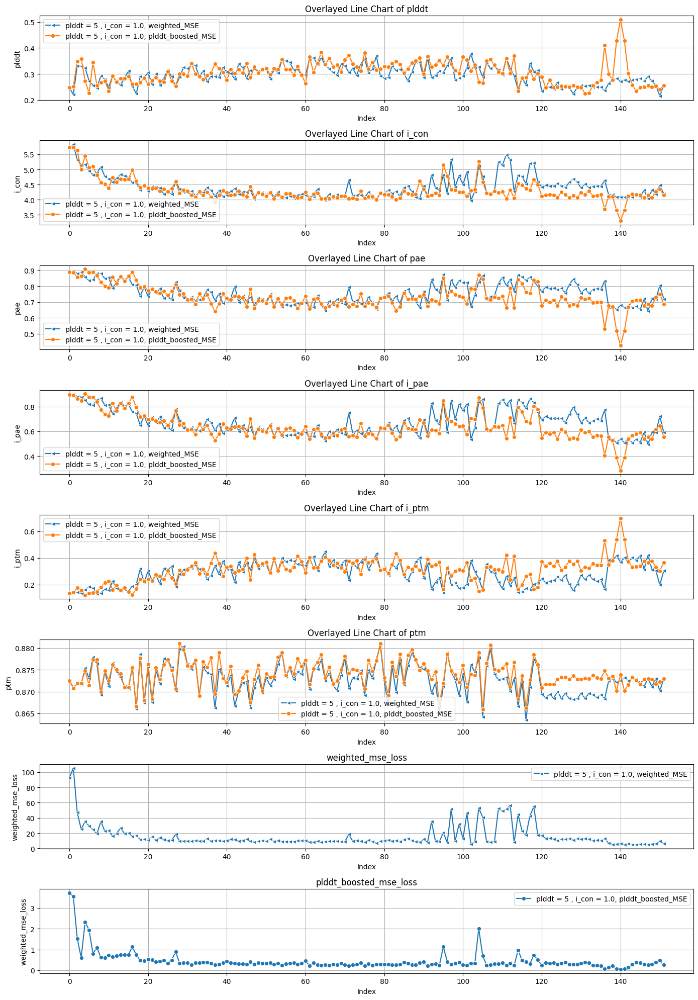

In [ ]:
import seaborn as sns
seed50_plddt5_normal = get_pickled['6MU7_hotspot_plddt5_l2mse1.0_len6_seed50']
seed50_plddt5_boosted = get_pickled['6MU7_hotspot_plddt5_l2mseboosted1.0_len6_seed50']

#@title training charts for seed50
normal_log = pd.DataFrame(seed50_plddt5_normal['log']['log'])
boosted_log = pd.DataFrame(seed50_plddt5_boosted['log']['log'])
# List of columns to plot
columns_to_plot = ['plddt', 'i_con', 'pae','i_pae','i_ptm','ptm']

# Create a figure with subplots
fig, axes = plt.subplots(nrows=len(columns_to_plot)+2, figsize=(14, 20))

for ax, col in zip(axes, columns_to_plot):
    sns.lineplot(data=normal_log, x=normal_log.index, y=col, marker='<', label='plddt = 5 , i_con = 1.0, weighted_MSE', ax=ax)
    sns.lineplot(data=boosted_log, x=boosted_log.index, y=col, marker='o', label='plddt = 5 , i_con = 1.0, plddt_boosted_MSE', ax=ax)
    ax.set_title(f'Overlayed Line Chart of {col}')
    ax.set_xlabel('Index')
    ax.set_ylabel(col)
    ax.legend()
    ax.grid(True)

#include weighted_mse_loss
ax = axes[-2]
sns.lineplot(data=normal_log, x=normal_log.index, y='weighted_mse_loss', marker='<', label='plddt = 5 , i_con = 1.0, weighted_MSE', ax=ax)
ax.set_title(f'weighted_mse_loss')
ax.set_xlabel('Index')
ax.set_ylabel('weighted_mse_loss')
ax.legend()
ax.grid(True)

#include weighted_mse_loss
ax = axes[-1]
sns.lineplot(data=boosted_log, x=boosted_log.index, y='plddt_boosted_mse_loss', marker='o', label='plddt = 5 , i_con = 1.0, plddt_boosted_MSE', ax=ax)
ax.set_title(f'plddt_boosted_mse_loss')
ax.set_xlabel('Index')
ax.set_ylabel('weighted_mse_loss')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

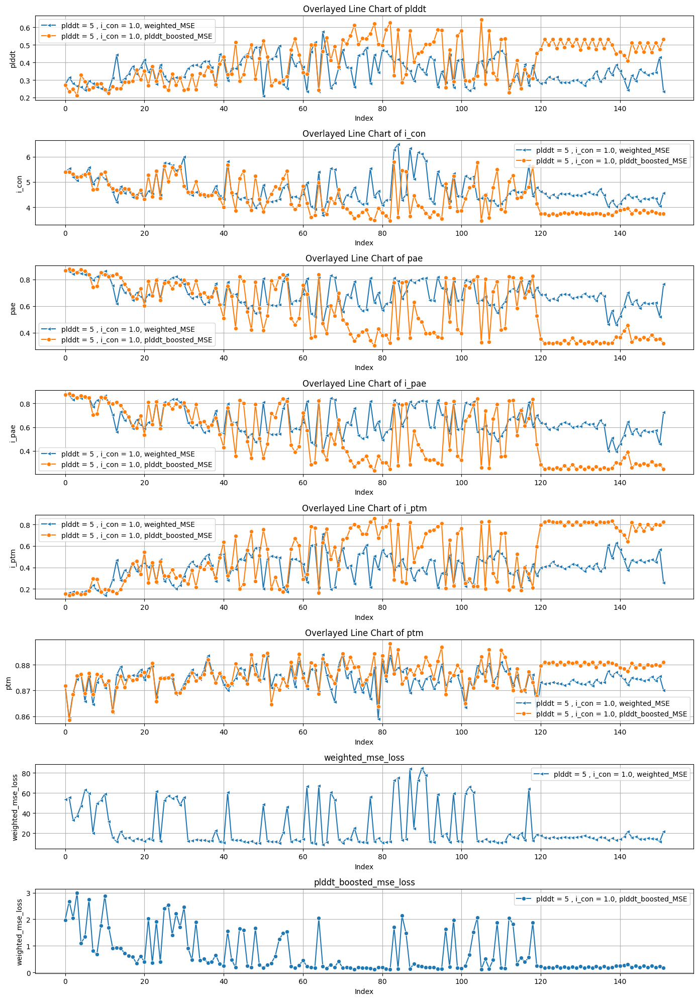

In [ ]:
import seaborn as sns
seed51_plddt5_normal = get_pickled['6MU7_hotspot_plddt5_l2mse1.0_len6_seed51']
seed51_plddt5_boosted = get_pickled['6MU7_hotspot_plddt5_l2mseboosted1.0_len6_seed51']

#@title training charts for seed51
normal_log = pd.DataFrame(seed51_plddt5_normal['log']['log'])
boosted_log = pd.DataFrame(seed51_plddt5_boosted['log']['log'])
# List of columns to plot
columns_to_plot = ['plddt', 'i_con', 'pae','i_pae','i_ptm','ptm']

# Create a figure with subplots
fig, axes = plt.subplots(nrows=len(columns_to_plot)+2, figsize=(14, 20))

for ax, col in zip(axes, columns_to_plot):
    sns.lineplot(data=normal_log, x=normal_log.index, y=col, marker='<', label='plddt = 5 , i_con = 1.0, weighted_MSE', ax=ax)
    sns.lineplot(data=boosted_log, x=boosted_log.index, y=col, marker='o', label='plddt = 5 , i_con = 1.0, plddt_boosted_MSE', ax=ax)
    ax.set_title(f'Overlayed Line Chart of {col}')
    ax.set_xlabel('Index')
    ax.set_ylabel(col)
    ax.legend()
    ax.grid(True)

#include weighted_mse_loss
ax = axes[-2]
sns.lineplot(data=normal_log, x=normal_log.index, y='weighted_mse_loss', marker='<', label='plddt = 5 , i_con = 1.0, weighted_MSE', ax=ax)
ax.set_title(f'weighted_mse_loss')
ax.set_xlabel('Index')
ax.set_ylabel('weighted_mse_loss')
ax.legend()
ax.grid(True)

#include weighted_mse_loss
ax = axes[-1]
sns.lineplot(data=boosted_log, x=boosted_log.index, y='plddt_boosted_mse_loss', marker='o', label='plddt = 5 , i_con = 1.0, plddt_boosted_MSE', ax=ax)
ax.set_title(f'plddt_boosted_mse_loss')
ax.set_xlabel('Index')
ax.set_ylabel('weighted_mse_loss')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

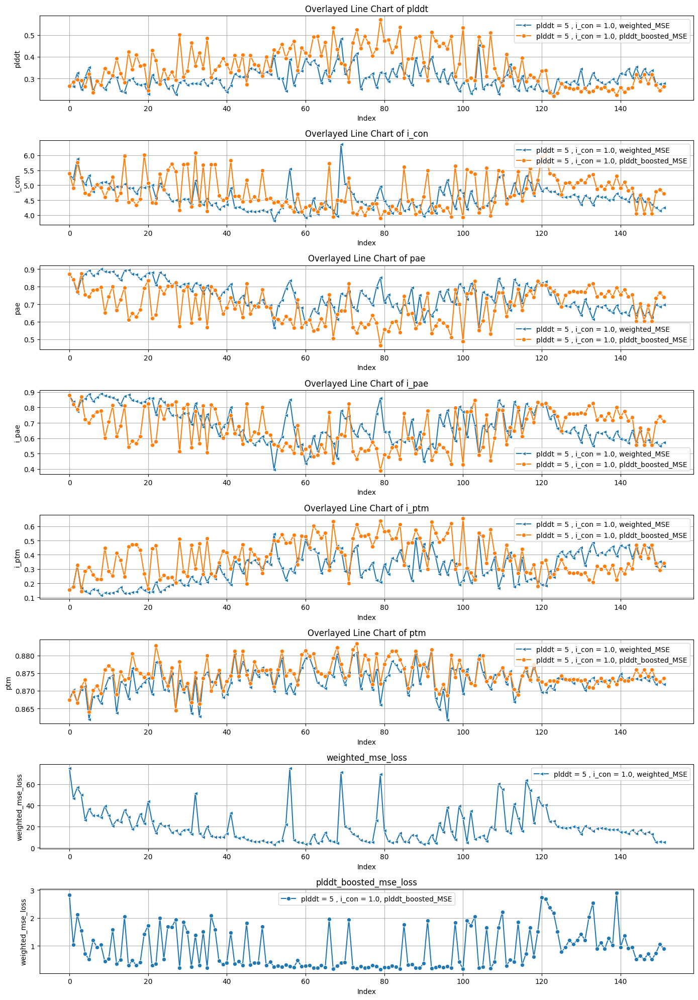

In [ ]:
import seaborn as sns
seed52_plddt5_normal = get_pickled['6MU7_hotspot_plddt5_l2mse1.0_len6_seed52']
seed52_plddt5_boosted = get_pickled['6MU7_hotspot_plddt5_l2mseboosted1.0_len6_seed52']

#@title training charts for seed52
normal_log = pd.DataFrame(seed52_plddt5_normal['log']['log'])
boosted_log = pd.DataFrame(seed52_plddt5_boosted['log']['log'])
# List of columns to plot
columns_to_plot = ['plddt', 'i_con', 'pae','i_pae','i_ptm','ptm']

# Create a figure with subplots
fig, axes = plt.subplots(nrows=len(columns_to_plot)+2, figsize=(14, 20))

for ax, col in zip(axes, columns_to_plot):
    sns.lineplot(data=normal_log, x=normal_log.index, y=col, marker='<', label='plddt = 5 , i_con = 1.0, weighted_MSE', ax=ax)
    sns.lineplot(data=boosted_log, x=boosted_log.index, y=col, marker='o', label='plddt = 5 , i_con = 1.0, plddt_boosted_MSE', ax=ax)
    ax.set_title(f'Overlayed Line Chart of {col}')
    ax.set_xlabel('Index')
    ax.set_ylabel(col)
    ax.legend()
    ax.grid(True)

#include weighted_mse_loss
ax = axes[-2]
sns.lineplot(data=normal_log, x=normal_log.index, y='weighted_mse_loss', marker='<', label='plddt = 5 , i_con = 1.0, weighted_MSE', ax=ax)
ax.set_title(f'weighted_mse_loss')
ax.set_xlabel('Index')
ax.set_ylabel('weighted_mse_loss')
ax.legend()
ax.grid(True)

#include weighted_mse_loss
ax = axes[-1]
sns.lineplot(data=boosted_log, x=boosted_log.index, y='plddt_boosted_mse_loss', marker='o', label='plddt = 5 , i_con = 1.0, plddt_boosted_MSE', ax=ax)
ax.set_title(f'plddt_boosted_mse_loss')
ax.set_xlabel('Index')
ax.set_ylabel('weighted_mse_loss')
ax.legend()
ax.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
#@title generate more compounds
import pickle
SEEDS = range(SEED_START, SEED_END)
for SEED in SEEDS:
  #set seed & model params
  model_1.restart(seq=binder_seq, seed = SEED)

  model_1.set_optimizer(optimizer=GD_method,
                      learning_rate=learning_rate,
                      norm_seq_grad=norm_seq_grad)
  models = model_1._model_names[:num_models]

  #change weights
  model_1.set_weights(i_con = 1.0,plddt=5.0)
  model_1.opt['weights']['binder_l2_mse_plddtboosted'] = 1.0
  print(model_1.opt)

  #run model
  flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}
  if optimizer == "pssm_semigreedy":
    model_1.design_pssm_semigreedy(120, 32, **flags)
    pssm = softmax(model_1._tmp["seq_logits"],1)

  model_1.save_pdb(f"{pdb}_hotspot_plddt5_l2mseboosted1.0_len{binder_len}_seed{SEED}.pdb")

  # write results to dataframe
  df1 = pd.DataFrame(model_1._tmp['log'])
  df1['pdb'] = pdb
  df1['seed'] = SEED
  df1['train_seq'] = df1.index + 1
  df1['hotspot'] = target_hotspots

  # best binder results
  best_df = pd.DataFrame(model_1._tmp['best']["aux"]["log"])
  best_df['sequence'] = model_1.get_seq()[0]
  best_df['pdb'] = pdb
  best_df['seed'] = SEED
  best_df['hotspot'] = target_hotspots
  best_df['length'] = model_1._binder_len
  print(f"Sequence for {pdb}, seed = {SEED}: ",model_1.get_seq()[0])

  #append
  log_df = pd.concat([log_df, df1])
  results_df = pd.concat([results_df,best_df])

{'alpha': 2.0, 'con': {'binary': False, 'cutoff': 14.0, 'num': 2, 'num_pos': inf, 'seqsep': 9}, 'dropout': True, 'fape_cutoff': 10.0, 'hard': 0.0, 'hotspot': array([ 33,  72,  73,  76,  77,  80,  81,  85, 156, 209, 210, 211, 322,
       327, 328, 329, 334, 336, 366, 367, 368, 369, 370, 371, 374, 375,
       376, 411]), 'i_con': {'binary': False, 'cutoff': 21.6875, 'num': 1, 'num_pos': inf}, 'learning_rate': 0.1, 'norm_seq_grad': True, 'num_models': 1, 'num_recycles': 0, 'pssm_hard': True, 'sample_models': True, 'soft': 0.0, 'temp': 1.0, 'template': {'rm_ic': False}, 'weights': {'con': 0.0, 'exp_res': 0.0, 'helix': 0.0, 'i_con': 1.0, 'i_pae': 0.0, 'pae': 0.0, 'plddt': 5.0, 'seq_ent': 0.0, 'binder_l2_mse_plddtboosted': 1.0}}
Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.01 temp 1 loss 12.43 i_con 5.55 plddt 0.25 ptm 0.86 i_ptm 0.13 plddt_boosted_mse_loss 3.12
2 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss 9.48 i_con 5.18 plddt 0.33 ptm 0.87 i_ptm 0.13 plddt

In [ ]:
#@title define custom design function
def centroid_design_function(self,flags):

  #change weights
  self.set_weights(i_con = 1.0,plddt=1.0)
  self.opt['weights']['binder_l2_mse_plddtboosted'] = 5.0
  print("Stage 1: setting model weights to :",model_1.opt)

  # take 50 steps
  self.design_pssm_semigreedy(60, 0, **flags)

  # increase weight for plddt
  print("Stage 2: setting model weights to :",model_1.opt)
  self.opt['weights']['binder_l2_mse_plddtboosted'] = 2.0
  self.set_weights(plddt=2.0)
  self.design_pssm_semigreedy(40, 0, **flags)

  # increase number of recycles
  self.set_opt(num_recycles=1)
  self.set_weights(plddt=10.0)
  print("Stage 3: setting model weights to :",model_1.opt)
  self.design_pssm_semigreedy(0, 60, **flags)


In [ ]:
#@title Experiment 5.3: Generate w/ hotspot w/ plddt 1.0 & l2_mse 1.0 (trying to get close to experimental)
SEEDS = range(SEED_START, SEED_END)
for SEED in SEEDS:
  #set seed & model params
  model_1.restart(seq=binder_seq, seed = SEED)

  model_1.set_optimizer(optimizer=GD_method,
                      learning_rate=learning_rate,
                      norm_seq_grad=norm_seq_grad)
  models = model_1._model_names[:num_models]

  #run model
  flags = {"num_recycles":num_recycles,
         "models":models,
         "dropout":dropout}

  if optimizer == "pssm_semigreedy":
    centroid_design_function(model_1,flags)
    pssm = softmax(model_1._tmp["seq_logits"],1)

  model_1.save_pdb(f"Experimental_Recreation_{pdb}_hotspot_varyingweights_len{binder_len}_seed{SEED}.pdb")

  # write results to dataframe
  df1 = pd.DataFrame(model_1._tmp['log'])
  df1['pdb'] = pdb
  df1['seed'] = SEED
  df1['train_seq'] = df1.index + 1
  df1['hotspot'] = target_hotspots

  # best binder results
  best_df = pd.DataFrame(model_1._tmp['best']["aux"]["log"])
  best_df['sequence'] = model_1.get_seq()[0]
  best_df['pdb'] = pdb
  best_df['seed'] = SEED
  best_df['hotspot'] = target_hotspots
  best_df['length'] = model_1._binder_len
  print(f"Sequence for {pdb}, seed = {SEED}: ",model_1.get_seq()[0])

  #append
  log_df = pd.concat([log_df, df1])
  results_df = pd.concat([results_df,best_df])

Stage 1: setting model weights to : {'alpha': 2.0, 'con': {'binary': False, 'cutoff': 14.0, 'num': 2, 'num_pos': inf, 'seqsep': 9}, 'dropout': True, 'fape_cutoff': 10.0, 'hard': 0.0, 'hotspot': array([ 33,  72,  73,  76,  77,  80,  81,  85, 156, 209, 210, 211, 322,
       327, 328, 329, 334, 336, 366, 367, 368, 369, 370, 371, 374, 375,
       376, 411]), 'i_con': {'binary': False, 'cutoff': 21.6875, 'num': 1, 'num_pos': inf}, 'learning_rate': 0.1, 'norm_seq_grad': True, 'num_models': 1, 'num_recycles': 0, 'pssm_hard': True, 'sample_models': True, 'soft': 0.0, 'temp': 1.0, 'template': {'rm_ic': False}, 'weights': {'binder_l2_mse_plddtboosted': 5.0, 'con': 0.0, 'exp_res': 0.0, 'helix': 0.0, 'i_con': 1.0, 'i_pae': 0.0, 'pae': 0.0, 'plddt': 1.0, 'seq_ent': 0.0}}
Stage 1: running (logits → soft)
1 models [0] recycles 0 hard 0 soft 0.02 temp 1 loss 72.75 i_con 5.58 plddt 0.27 ptm 0.87 i_ptm 0.15 weighted_mse_loss 66.43
2 models [0] recycles 0 hard 0 soft 0.03 temp 1 loss 63.85 i_con 5.72 pld

In [ ]:
#@title save results
import datetime as dt

#save results
gen_log = log_df
gen_result = results_df
var = SEED_END-SEED_START

#capture runtime data
timestr = time.strftime("%Y%m%d-%H%M%S")

# List of DataFrames
log_filename = f'{timestr}_{pdb}_plddtboosted_seed{SEED_START}-{SEED_END}_log.csv'
result_filename = f'{timestr}_{pdb}_plddtboosted_seed{SEED_START}-{SEED_END}_results.csv'
gen_log.to_csv(log_filename, index=False)
gen_result.to_csv(result_filename, index=False)

In [ ]:
#@title Close runtime
from google.colab import runtime
runtime.unassign()